In [1]:
import os 
from deepmreye.util import data_generator
from deepmreye import analyse 
import glob
import numpy as np
import matplotlib.pyplot as plt
import re
from scipy.signal import butter, filtfilt
import nilearn.plotting as niplot 
import pickle 
from sklearn.decomposition import PCA
from scipy.ndimage import center_of_mass
import pandas as pd
from scipy.io import loadmat
import h5py
import seaborn 

2025-12-14 10:33:47.131504: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-12-14 10:33:47.187358: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-14 10:33:47.187427: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-14 10:33:47.189947: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-14 10:33:47.201909: I tensorflow/core/platform/cpu_feature_guar

In [2]:
class SubjectLoader:
    def __init__(self, root="/mnt/compneuro/comparison_of_methods/dataframes"):
        self.root = root

    def load_subject(self, subject_id):
        filename = os.path.join(self.root, f"sub-{subject_id}.h5")

        with h5py.File(filename, "r") as f:

            neural_data = f["neural_data"][:]

            ortvec_df = pd.DataFrame(
                f["ortvec"][:],
                columns=[c.decode() for c in f["ortvec_cols"][:]]
            )

            et_df = pd.DataFrame(
                f["et"][:],
                columns=[c.decode() for c in f["et_cols"][:]]
            )

            fmri_eye_df = pd.DataFrame(
                f["fmri_eye_features"][:],
                columns=[c.decode() for c in f["fmri_eye_cols"][:]]
            )

        return ortvec_df, neural_data, et_df, fmri_eye_df

In [3]:
roilist = pd.read_csv(
    "/mnt/compneuro/comparison_of_methods/matrices/roilist.txt",
    sep=r"\s+",
    header=None
).values.flatten()

neural_data=pd.DataFrame(neural_data)
neural_data.columns=roilist

NameError: name 'neural_data' is not defined

# 1 - Similarity between fMRIeye parameters


### Which parameters do give the highest consistency between right and left eyes? 

- Features that depend on the anatomical detail (Motion correction, Center of mass) perform better with non-normalized images
- Features do not depend on the anatomical detail is more reliable when calculated on the normalized images
- First 2 PCA's work well, but the similarity between eyes gradually decreases over for both normalized and non-normalized images


In [53]:
import pandas as pd

# Ensure column names are clean
corr_df.columns = corr_df.columns.str.strip()

# 1. Keep only CoM features
com_df = corr_df[corr_df['Feature'].str.startswith('MC_FULL_')]

# 2. Add a column indicating normalization
com_df['NormType'] = com_df['Feature'].apply(
    lambda x: 'Normalized' if x.endswith('_Norm') else 'NotNormalized'
)

# 3. Compute mean and SD across all subjects
summary_stats = (
    com_df
    .groupby('NormType')['Correlation']
    .agg(['mean', 'std'])
    .reset_index()
)

summary_stats


/tmp/ipykernel_663717/3744353379.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  com_df['NormType'] = com_df['Feature'].apply(


,NormType,mean,std
0,Normalized,0.048601,0.060426
1,NotNormalized,0.453447,0.268453


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


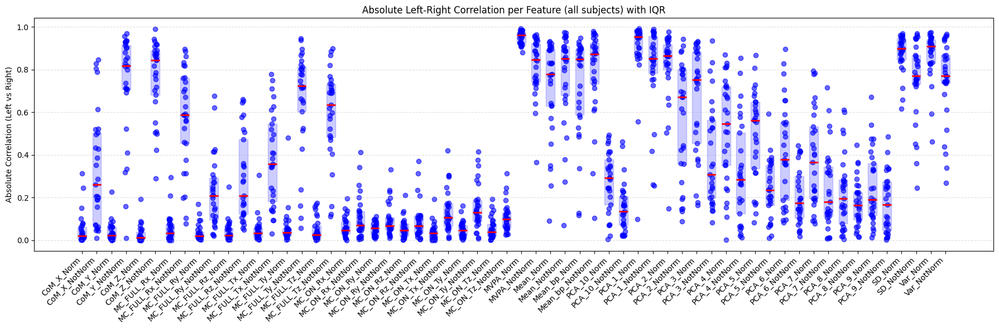

In [11]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

all_corrs = []

# -----------------------------
# Loop over subjects
# -----------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    _, _, _, fmri_eye_df = loader.load_subject(subj_id)

    # Identify left/right columns
    left_cols = [c for c in fmri_eye_df.columns if "_left" in c]
    right_cols = [c for c in fmri_eye_df.columns if "_right" in c]

    # Map full base name (remove only '_left' or '_right') -> column
    left_map = {c.replace("_left",""): c for c in left_cols}
    right_map = {c.replace("_right",""): c for c in right_cols}

    # Find common features (same except for left/right)
    common_features = set(left_map.keys()) & set(right_map.keys())

    for feature in sorted(common_features):
        col_left = left_map[feature]
        col_right = right_map[feature]
        corr = fmri_eye_df[col_left].corr(fmri_eye_df[col_right])
        corr = abs(corr)  # absolute value

        all_corrs.append({
            "Subject": subj_id,
            "Feature": feature,  # use full base name
            "Correlation": corr
        })

# -----------------------------
# Create DataFrame
# -----------------------------
corr_df = pd.DataFrame(all_corrs)
corr_df.to_csv("left_right_correlations_abs_fullname.csv", index=False)


# -----------------------------
# Plot absolute correlations with IQR
# -----------------------------
plt.figure(figsize=(18,6))  # wider figure

features_sorted = sorted(corr_df["Feature"].unique())

for i, feature in enumerate(features_sorted):
    vals = corr_df[corr_df["Feature"] == feature]["Correlation"].values
    x = np.ones_like(vals)*i + np.random.uniform(-0.1,0.1,len(vals))
    plt.scatter(x, vals, alpha=0.6, color="blue")

    # Compute 25th and 75th percentile (IQR)
    q1 = np.percentile(vals, 25)
    q3 = np.percentile(vals, 75)
    plt.fill_between([i-0.3, i+0.3], q1, q3, color='blue', alpha=0.2)

    # Median line
    median = np.median(vals)
    plt.hlines(median, i-0.3, i+0.3, color='red', linewidth=2)

plt.xticks(range(len(features_sorted)), features_sorted, rotation=45, ha="right")
plt.ylabel("Absolute Correlation (Left vs Right)")
plt.title("Absolute Left-Right Correlation per Feature (all subjects) with IQR")
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


### What is the frequency characteristics of the features? 

- The common frequency band is 0-0.025
- The "anatomical" measures (MC and CoM) have higher ferquency in the higher bands, when they are normalized, and reflect the structure of the rest of the signals when not normalized.


In [5]:
import os
import numpy as np
import pandas as pd
from scipy.signal import welch
import matplotlib.pyplot as plt

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

fs = 1 / 2.5  # TR = 2.5 s → 0.4 Hz sampling rate

# -----------------------------
# Feature grouping function
# -----------------------------
def extract_feature_group(var_name):
    var_lower = var_name.lower()

    # avg -> treat as both
    if "avg" in var_lower:
        var_name = var_name.replace("_avg", "_both")

    # MC_ON / MC_FULL
    if var_name.startswith("MC_ON"):
        return "MC_ON"
    if var_name.startswith("MC_FULL"):
        return "MC_FULL"

    # CoM -> group as CoM
    if var_name.startswith("CoM"):
        return "CoM"

    # PCA -> keep PCA_X
    if var_name.startswith("PCA_"):
        for suffix in ["_left", "_right", "_both"]:
            if var_name.endswith(suffix):
                return var_name[:-len(suffix)]
        return var_name

    # MVPA -> group as MVPA
    if var_name.startswith("MVPA"):
        return "MVPA"

    # Mean, Mean_bp, Var, SD -> strip side suffix
    for prefix in ["Mean", "Mean_bp", "Var", "SD"]:
        if var_name.startswith(prefix):
            for suffix in ["_left", "_right", "_both"]:
                if var_name.endswith(suffix):
                    return var_name[:-len(suffix)]
            return var_name

    # fallback: keep as-is
    return var_name

# -----------------------------
# Choose column type: "_Norm" or "_NotNorm"
# -----------------------------
COL_TYPE = "_NotNorm"  # change to "_NotNorm" if desired

# -----------------------------
# Loop over subjects
# -----------------------------
all_psd = []  # store per-subject PSDs

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    # Load subject
    ortvec_df, neural_data, et_df, fmri_eye_df = loader.load_subject(subj_id)

    # Select columns
    selected_cols = [c for c in fmri_eye_df.columns if c.endswith(COL_TYPE)]

    for col in selected_cols:
        ts = fmri_eye_df[col].values
        f, Pxx = welch(ts, fs=fs, nperseg=min(128,len(ts)))

        group = extract_feature_group(col.replace(COL_TYPE,""))

        # Save PSD for each frequency point
        for freq, power in zip(f, Pxx):
            all_psd.append({
                "Subject": subj_id,
                "Variable": col.replace(COL_TYPE,""),
                "FeatureGroup": group,
                "Frequency": freq,
                "Power": power
            })

# -----------------------------
# Convert to DataFrame
# -----------------------------
psd_df = pd.DataFrame(all_psd)
psd_df.to_csv(f"psd_all_subjects_{COL_TYPE}_notnorm.csv", index=False)
print("PSD data saved.")


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100
PSD data saved.


In [10]:
corr_df

,Subject,Feature,Correlation
0,9001,CoM_X_Norm,0.003526
1,9001,CoM_X_NotNorm,0.287929
2,9001,CoM_Y_Norm,0.017490
3,9001,CoM_Y_NotNorm,0.691624
4,9001,CoM_Z_Norm,0.000602
...,...,...,...
1735,9100,PCA_9_NotNorm,0.037094
1736,9100,SD_Norm,0.892606
1737,9100,SD_NotNorm,0.906496
1738,9100,Var_Norm,0.884876


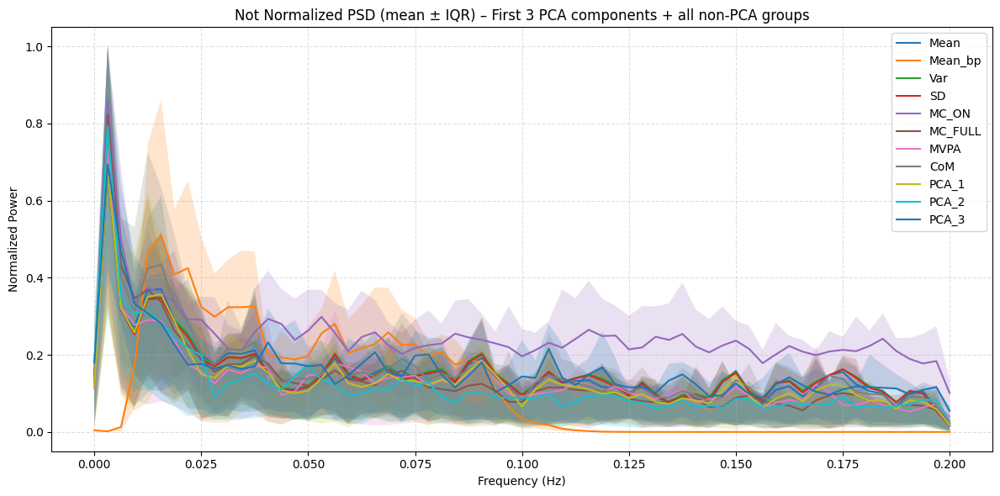

In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re

# psd_df = pd.read_csv("psd_all_subjects__Norm.csv")  # load your PSD DataFrame

# -----------------------------
# Identify PCA groups and sort numerically
# -----------------------------
def pca_sort_key(name):
    # Extract the number after "PCA_"
    m = re.match(r"PCA_(\d+)", name)
    return int(m.group(1)) if m else np.inf

all_pca_groups = [g for g in psd_df["FeatureGroup"].unique() if g.startswith("PCA_")]
all_pca_groups_sorted = sorted(all_pca_groups, key=pca_sort_key)

# Select only first 3 PCA components numerically
first_3_pca = all_pca_groups_sorted[:3]

# Keep all non-PCA groups plus first 3 PCA
plot_groups = [g for g in psd_df["FeatureGroup"].unique() if not g.startswith("PCA_")] + first_3_pca
psd_df_subset = psd_df[psd_df["FeatureGroup"].isin(plot_groups)]

# -----------------------------
# Aggregate PSD by feature group
# -----------------------------
group_psd = {}
for group in plot_groups:
    df_group = psd_df_subset[psd_df_subset["FeatureGroup"] == group]
    
    # Pivot: rows = Subject, columns = Frequency
    pivot = df_group.pivot_table(index="Subject", columns="Frequency", values="Power")
    
    # Normalize each subject's PSD to unit max
    pivot_norm = pivot.div(pivot.max(axis=1), axis=0)
    
    # Compute mean and IQR
    mean_psd = pivot_norm.mean(axis=0)
    q1_psd = pivot_norm.quantile(0.25, axis=0)
    q3_psd = pivot_norm.quantile(0.75, axis=0)
    
    group_psd[group] = {"mean": mean_psd, "q1": q1_psd, "q3": q3_psd}

# -----------------------------
# Plot normalized PSD
# -----------------------------
plt.figure(figsize=(12, 6))
for group, vals in group_psd.items():
    freqs = vals["mean"].index.values
    plt.plot(freqs, vals["mean"], label=group)
    plt.fill_between(freqs, vals["q1"], vals["q3"], alpha=0.2)

plt.xlabel("Frequency (Hz)")
plt.ylabel("Normalized Power")
plt.title("Not Normalized PSD (mean ± IQR) – First 3 PCA components + all non-PCA groups")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


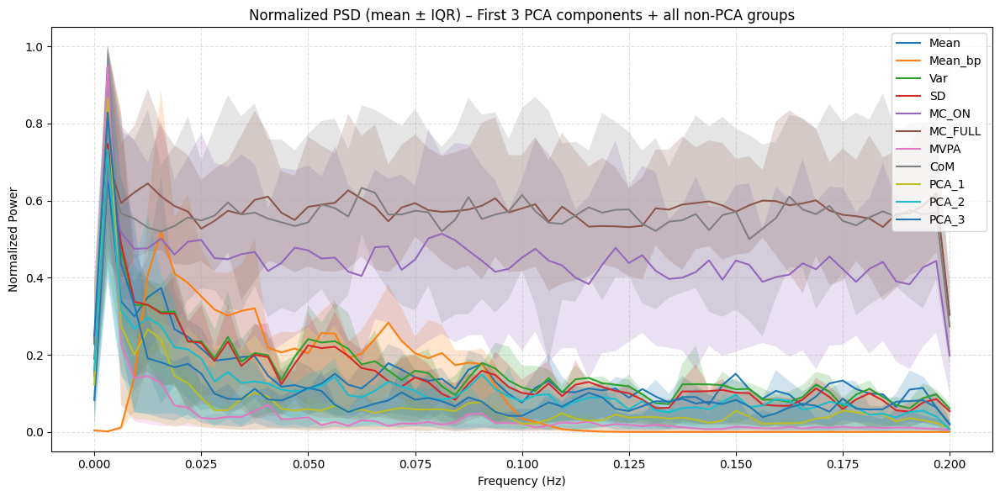

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re

# psd_df = pd.read_csv("psd_all_subjects__Norm.csv")  # load your PSD DataFrame

# -----------------------------
# Identify PCA groups and sort numerically
# -----------------------------
def pca_sort_key(name):
    # Extract the number after "PCA_"
    m = re.match(r"PCA_(\d+)", name)
    return int(m.group(1)) if m else np.inf

all_pca_groups = [g for g in psd_df["FeatureGroup"].unique() if g.startswith("PCA_")]
all_pca_groups_sorted = sorted(all_pca_groups, key=pca_sort_key)

# Select only first 3 PCA components numerically
first_3_pca = all_pca_groups_sorted[:3]

# Keep all non-PCA groups plus first 3 PCA
plot_groups = [g for g in psd_df["FeatureGroup"].unique() if not g.startswith("PCA_")] + first_3_pca
psd_df_subset = psd_df[psd_df["FeatureGroup"].isin(plot_groups)]

# -----------------------------
# Aggregate PSD by feature group
# -----------------------------
group_psd = {}
for group in plot_groups:
    df_group = psd_df_subset[psd_df_subset["FeatureGroup"] == group]
    
    # Pivot: rows = Subject, columns = Frequency
    pivot = df_group.pivot_table(index="Subject", columns="Frequency", values="Power")
    
    # Normalize each subject's PSD to unit max
    pivot_norm = pivot.div(pivot.max(axis=1), axis=0)
    
    # Compute mean and IQR
    mean_psd = pivot_norm.mean(axis=0)
    q1_psd = pivot_norm.quantile(0.25, axis=0)
    q3_psd = pivot_norm.quantile(0.75, axis=0)
    
    group_psd[group] = {"mean": mean_psd, "q1": q1_psd, "q3": q3_psd}

# -----------------------------
# Plot normalized PSD
# -----------------------------
plt.figure(figsize=(12, 6))
for group, vals in group_psd.items():
    freqs = vals["mean"].index.values
    plt.plot(freqs, vals["mean"], label=group)
    plt.fill_between(freqs, vals["q1"], vals["q3"], alpha=0.2)

plt.xlabel("Frequency (Hz)")
plt.ylabel("Normalized Power")
plt.title("Normalized PSD (mean ± IQR) – First 3 PCA components + all non-PCA groups")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


### Correlation between the normalized and not-normalized signals

- Another way to look the data, showing that anatomical methods are less robust to normalization

In [31]:
import os
import pandas as pd

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

rows = []

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    # Load data
    _, _, _, fmri_eye_df = loader.load_subject(subj_id)

    # Collect normalized variables
    norm_cols = [c for c in fmri_eye_df.columns if c.endswith("_Norm")]

    for norm_col in norm_cols:
        base = norm_col[:-5]  # remove "_Norm"
        notnorm_col = base + "_NotNorm"

        if notnorm_col in fmri_eye_df.columns:
            corr = fmri_eye_df[norm_col].corr(fmri_eye_df[notnorm_col])

            rows.append({
                "Subject": subj_id,
                "Variable": base,
                "Correlation": corr
            })

# Build final dataframe
group_df = pd.DataFrame(rows)


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


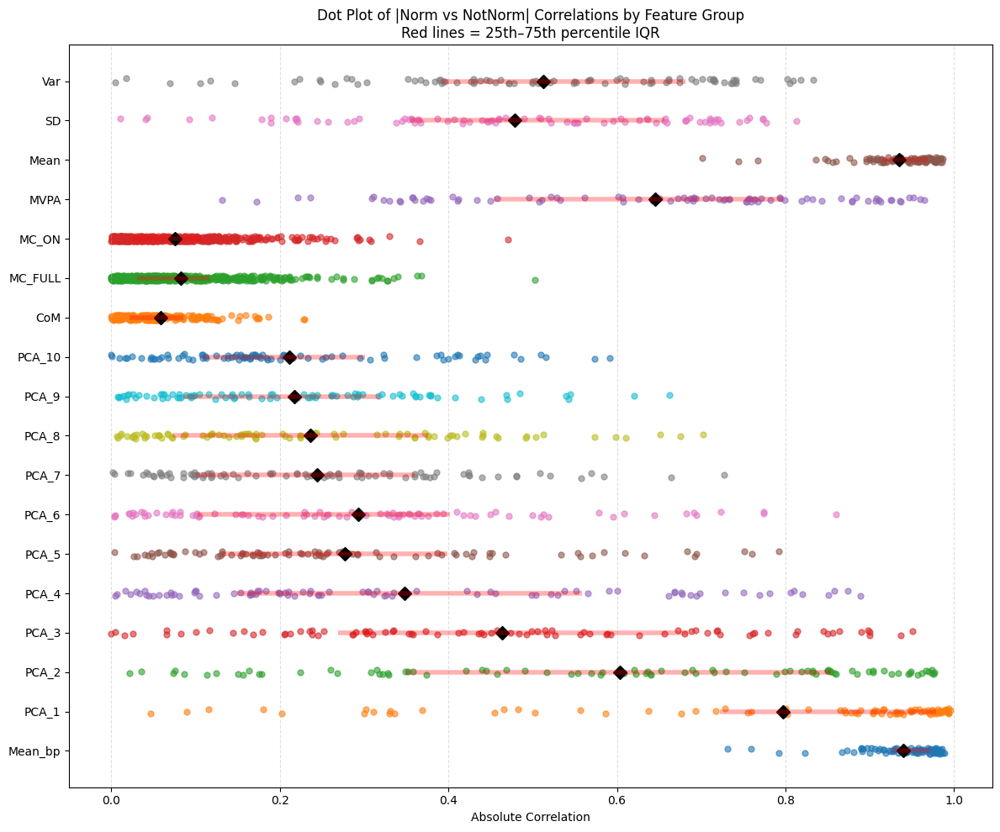

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Step 1: Extract base feature group
# -----------------------------
def extract_feature_group(var_name):
    """
    Extract feature group for plotting:
    - Variables with 'avg' -> strip '_avg'
    - MC_ON, MC_FULL -> group as MC_ON, MC_FULL
    - CoM_* -> group as CoM
    - PCA_*, MVPA_*, Mean_*, Var_*, SD_* -> base prefix (PCA keeps number)
    - Strip _left, _right, _both suffixes for all except PCA
    """
    var_lower = var_name.lower()

    # 1. avg -> remove
    if "avg" in var_lower:
        var_name = var_name.replace("_avg", "")

    # 2. MC_ON / MC_FULL
    if var_name.startswith("MC_ON"):
        return "MC_ON"
    if var_name.startswith("MC_FULL"):
        return "MC_FULL"

    # 3. CoM -> group as CoM
    if var_name.startswith("CoM"):
        return "CoM"

    # 4. PCA -> keep PCA_X
    if var_name.startswith("PCA_"):
        # remove side suffix
        for suffix in ["_left", "_right", "_both"]:
            if var_name.endswith(suffix):
                return var_name[:-len(suffix)]
        return var_name

    # 5. MVPA -> group as MVPA
    if var_name.startswith("MVPA"):
        return "MVPA"

    # 6. Mean, Mean_bp, Var, SD -> strip side suffix
    for prefix in ["Mean", "Mean_bp", "Var", "SD"]:
        if var_name.startswith(prefix):
            for suffix in ["_left", "_right", "_both"]:
                if var_name.endswith(suffix):
                    return var_name[:-len(suffix)]
            return var_name

    # fallback: keep as is
    return var_name

# Step 1: Collect all normalized variables
norm_cols = [c for c in fmri_eye_df.columns if c.endswith("_Norm")]

rows = []

for norm_col in norm_cols:
    base = norm_col[:-5]  # remove "_Norm"
    notnorm_col = base + "_NotNorm"

    if notnorm_col in fmri_eye_df.columns:
        corr = fmri_eye_df[norm_col].corr(fmri_eye_df[notnorm_col])
        rows.append([base, corr])

import os
import pandas as pd

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

rows = []

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    # Load data
    _, _, _, fmri_eye_df = loader.load_subject(subj_id)

    # Collect normalized variables
    norm_cols = [c for c in fmri_eye_df.columns if c.endswith("_Norm")]

    for norm_col in norm_cols:
        base = norm_col[:-5]  # remove "_Norm"
        notnorm_col = base + "_NotNorm"

        if notnorm_col in fmri_eye_df.columns:
            corr = fmri_eye_df[norm_col].corr(fmri_eye_df[notnorm_col])

            rows.append({
                "Subject": subj_id,
                "Variable": base,
                "Correlation": corr
            })

# Build final dataframe
group_df = pd.DataFrame(rows)

# Add feature group and absolute correlation
group_df["FeatureGroup"] = group_df["Variable"].apply(extract_feature_group)
group_df["abs_corr"] = group_df["Correlation"].abs()

# -----------------------------
# Step 3: Define custom order
# -----------------------------
custom_order = []

# 1. Mean_
custom_order.extend([fg for fg in group_df["FeatureGroup"].unique() if fg.startswith("Mean_")])
# 2. Mean_bp_
custom_order.extend([fg for fg in group_df["FeatureGroup"].unique() if fg.startswith("Mean_bp_")])
# 3. Var_
custom_order.extend([fg for fg in group_df["FeatureGroup"].unique() if fg.startswith("Var_")])
# 4. SD_
custom_order.extend([fg for fg in group_df["FeatureGroup"].unique() if fg.startswith("SD_")])
# 5. PCA_1 to PCA_10
for i in range(1, 11):
    if f"PCA_{i}" in group_df["FeatureGroup"].unique():
        custom_order.append(f"PCA_{i}")
# 6. MVPA_
custom_order.extend([fg for fg in group_df["FeatureGroup"].unique() if fg.startswith("MVPA_")])
# 7. The rest
rest = [fg for fg in group_df["FeatureGroup"].unique() if fg not in custom_order]
custom_order.extend(sorted(rest))

# Map y positions
y_positions = {fg: i for i, fg in enumerate(custom_order)}

# -----------------------------
# Step 4: Dot plot with IQR
# -----------------------------
plt.figure(figsize=(12, 10))

def jitter(values, amount=0.05):
    return values + np.random.uniform(-amount, amount, size=len(values))

for fg in custom_order:
    df_fg = group_df[group_df["FeatureGroup"] == fg]
    y = np.full(len(df_fg), y_positions[fg], dtype=float)
    y = jitter(y, amount=0.07)
    
    # scatter dots
    plt.scatter(df_fg["abs_corr"], y, alpha=0.6, s=25)
    
    # group mean
    mean_corr = df_fg["abs_corr"].mean()
    plt.plot([mean_corr], [y_positions[fg]], marker="D", markersize=8, color="black")
    
    # IQR (25th–75th percentile)
    q1 = df_fg["abs_corr"].quantile(0.25)
    q3 = df_fg["abs_corr"].quantile(0.75)
    plt.hlines(y_positions[fg], xmin=q1, xmax=q3, color="red", linewidth=4, alpha=0.3)

# Formatting
plt.yticks(list(y_positions.values()), list(y_positions.keys()))
plt.xlabel("Absolute Correlation")
plt.title("Dot Plot of |Norm vs NotNorm| Correlations by Feature Group\nRed lines = 25th–75th percentile IQR")
plt.grid(axis="x", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


### Similarity between the signals - Clustering 

- MC_ON performs poorly. It has no consistency or explanatory power in the PCs. It is possible that the implementation failed.
- The major clusters are (PCA_1, Mean*. MC/CoM in Y), (MVPA, MC/CoM in Z), (MC/CoM in X)

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


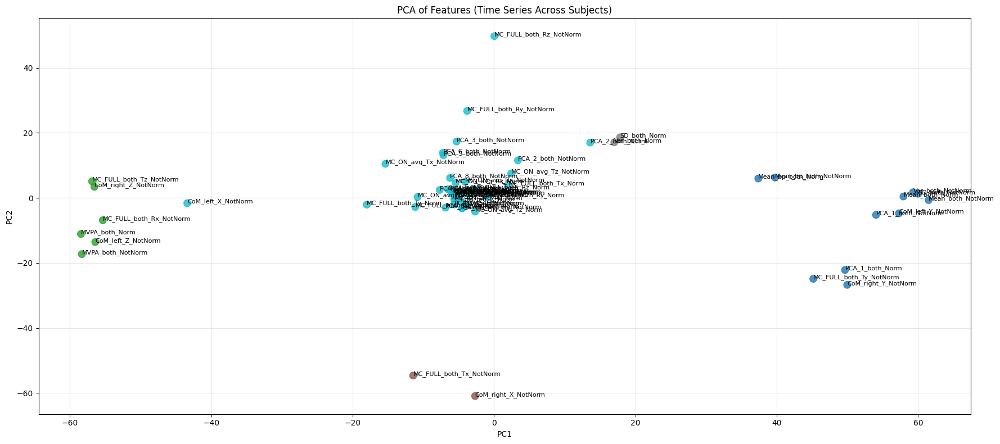

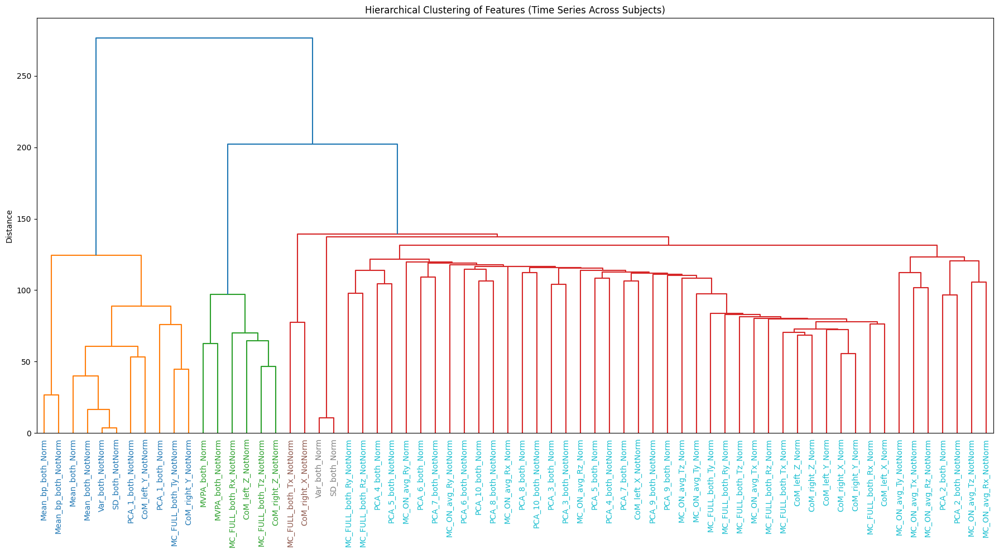

In [22]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# -----------------------------
# Load all subjects and stack time series
# -----------------------------
feature_series = {}  # feature_name -> concatenated time series across subjects

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    _, _, _, fmri_eye_df = loader.load_subject(subj_id)

    for feature in fmri_eye_df.columns:
        # Include CoM_X/Y/Z or features with _both/_avg (excluding CoM)
        if feature.startswith("CoM"):
            include_feature = True
        elif "_both" in feature or "_avg" in feature:
            include_feature = True
        else:
            include_feature = False  # exclude _left/_right features

        if include_feature:
            ts = fmri_eye_df[feature].values
            ts = (ts - ts.mean()) / ts.std()  # z-score normalize per subject
            if feature in feature_series:
                feature_series[feature] = np.concatenate([feature_series[feature], ts])
            else:
                feature_series[feature] = ts

# Create feature × time matrix
features = list(feature_series.keys())
data_matrix = np.array([feature_series[f] for f in features])

# Standardize features across concatenated time points
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_matrix)

# -----------------------------
# Hierarchical clustering
# -----------------------------
linked = linkage(data_scaled, method='ward')
n_clusters = 5
cluster_labels = fcluster(linked, n_clusters, criterion='maxclust')
feature_clusters = dict(zip(features, cluster_labels))

# Colors for clusters
colors = plt.cm.tab10(np.linspace(0, 1, n_clusters))
feature_colors = [colors[feature_clusters[f]-1] for f in features]

# -----------------------------
# PCA for visualization (enlarged)
# -----------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(data_scaled)

plt.figure(figsize=(18,8))  # wider and taller
plt.scatter(pcs[:,0], pcs[:,1], c=feature_colors, s=80, alpha=0.8)
for i, feature in enumerate(features):
    plt.text(pcs[i,0]+0.01, pcs[i,1]+0.01, feature, fontsize=8)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Features (Time Series Across Subjects)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -----------------------------
# Dendrogram (enlarged)
# -----------------------------
plt.figure(figsize=(18,10))  # wider and taller
dendro = dendrogram(linked, labels=features, leaf_rotation=90, leaf_font_size=10)
ax = plt.gca()
x_labels = ax.get_xmajorticklabels()
for lbl in x_labels:
    feature_name = lbl.get_text()
    lbl.set_color(colors[feature_clusters[feature_name]-1])

plt.title("Hierarchical Clustering of Features (Time Series Across Subjects)")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()


### Conclusion:
Norm versions Mean, Mean_bp, Var, SD, PCA_1, PCA_2, PCA_3, MVPA
NotNorm versions of CoM_X,CoM_Y, CoM_Z, MC_FULL_Tx,MC_FULL_Ty,MC_FULL_Tz,MC_FULL_Rx,MC_FULL_Ry,MC_FULL_Rz will be kept 

the rest will be discarded 

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


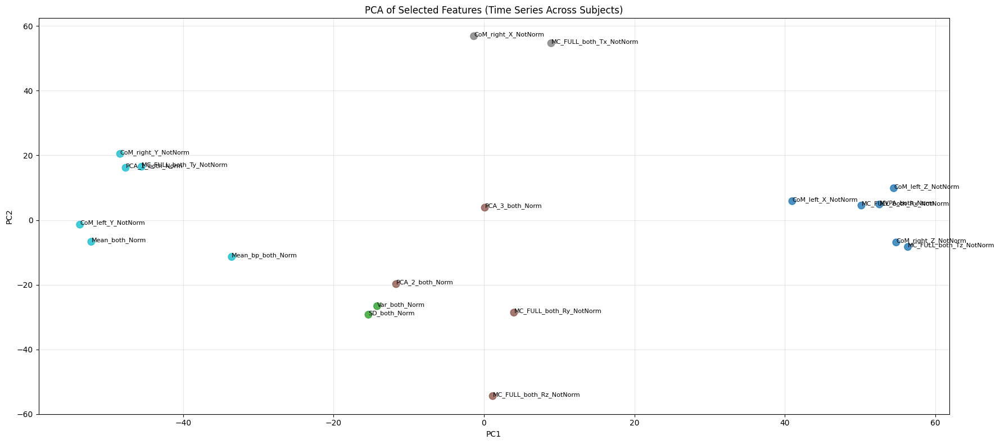

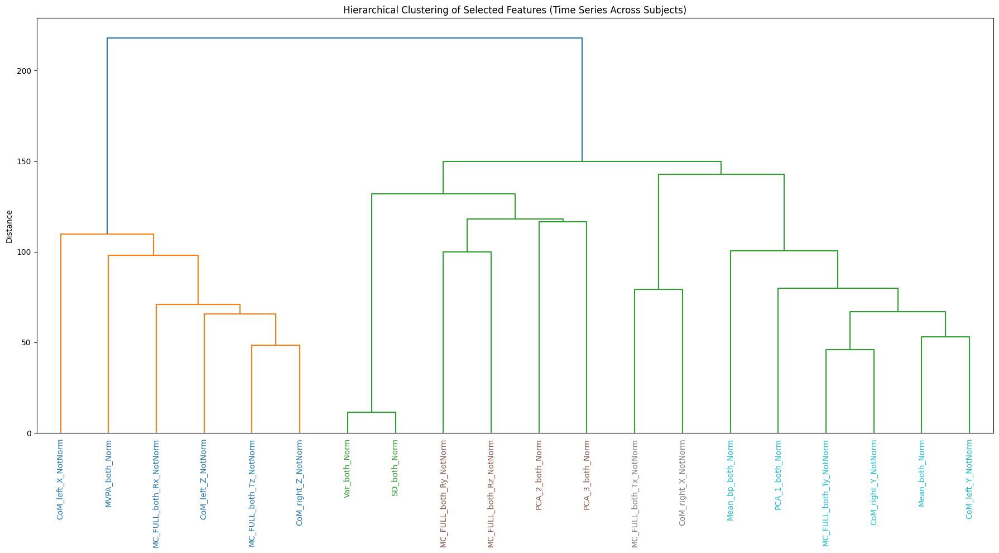

In [11]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# -----------------------------
# EXACT columns to include
# -----------------------------
columns_to_use = [
    'Mean_both_Norm',
    'Mean_bp_both_Norm',
    'Var_both_Norm',
    'SD_both_Norm',
    'MC_FULL_both_Tx_NotNorm',
    'MC_FULL_both_Ty_NotNorm',
    'MC_FULL_both_Tz_NotNorm',
    'MC_FULL_both_Rx_NotNorm',
    'MC_FULL_both_Ry_NotNorm',
    'MC_FULL_both_Rz_NotNorm',
    'PCA_1_both_Norm',
    'PCA_2_both_Norm',
    'PCA_3_both_Norm',
    'MVPA_both_Norm',
    'CoM_left_X_NotNorm',
    'CoM_left_Y_NotNorm',
    'CoM_left_Z_NotNorm',
    'CoM_right_X_NotNorm',
    'CoM_right_Y_NotNorm',
    'CoM_right_Z_NotNorm'
]

# -----------------------------
# Load and stack time series across subjects
# -----------------------------
feature_series = {}  # feature_name -> concatenated time series

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    _, _, _, fmri_eye_df = loader.load_subject(subj_id)

    for col in columns_to_use:
        if col not in fmri_eye_df.columns:
            print(f"Warning: {col} not found for subject {subj_id}, skipping.")
            continue

        ts = fmri_eye_df[col].values
        ts = (ts - ts.mean()) / ts.std()  # z-score normalize per subject

        if col in feature_series:
            feature_series[col] = np.concatenate([feature_series[col], ts])
        else:
            feature_series[col] = ts

# -----------------------------
# Create feature × time matrix
# -----------------------------
features = list(feature_series.keys())
data_matrix = np.array([feature_series[f] for f in features])

# Standardize features across concatenated time points
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_matrix)

# -----------------------------
# Hierarchical clustering
# -----------------------------
linked = linkage(data_scaled, method='ward')
n_clusters = 5
cluster_labels = fcluster(linked, n_clusters, criterion='maxclust')
feature_clusters = dict(zip(features, cluster_labels))

# Colors for clusters
colors = plt.cm.tab10(np.linspace(0, 1, n_clusters))
feature_colors = [colors[feature_clusters[f]-1] for f in features]

# -----------------------------
# PCA for visualization
# -----------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(data_scaled)

plt.figure(figsize=(18,8))
plt.scatter(pcs[:,0], pcs[:,1], c=feature_colors, s=80, alpha=0.8)
for i, feature in enumerate(features):
    plt.text(pcs[i,0]+0.01, pcs[i,1]+0.01, feature, fontsize=8)

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Selected Features (Time Series Across Subjects)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -----------------------------
# Dendrogram
# -----------------------------
plt.figure(figsize=(18,10))
dendro = dendrogram(linked, labels=features, leaf_rotation=90, leaf_font_size=10)
ax = plt.gca()
x_labels = ax.get_xmajorticklabels()
for lbl in x_labels:
    feature_name = lbl.get_text()
    lbl.set_color(colors[feature_clusters[feature_name]-1])

plt.title("Hierarchical Clustering of Selected Features (Time Series Across Subjects)")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()


### Correlation Matrix

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


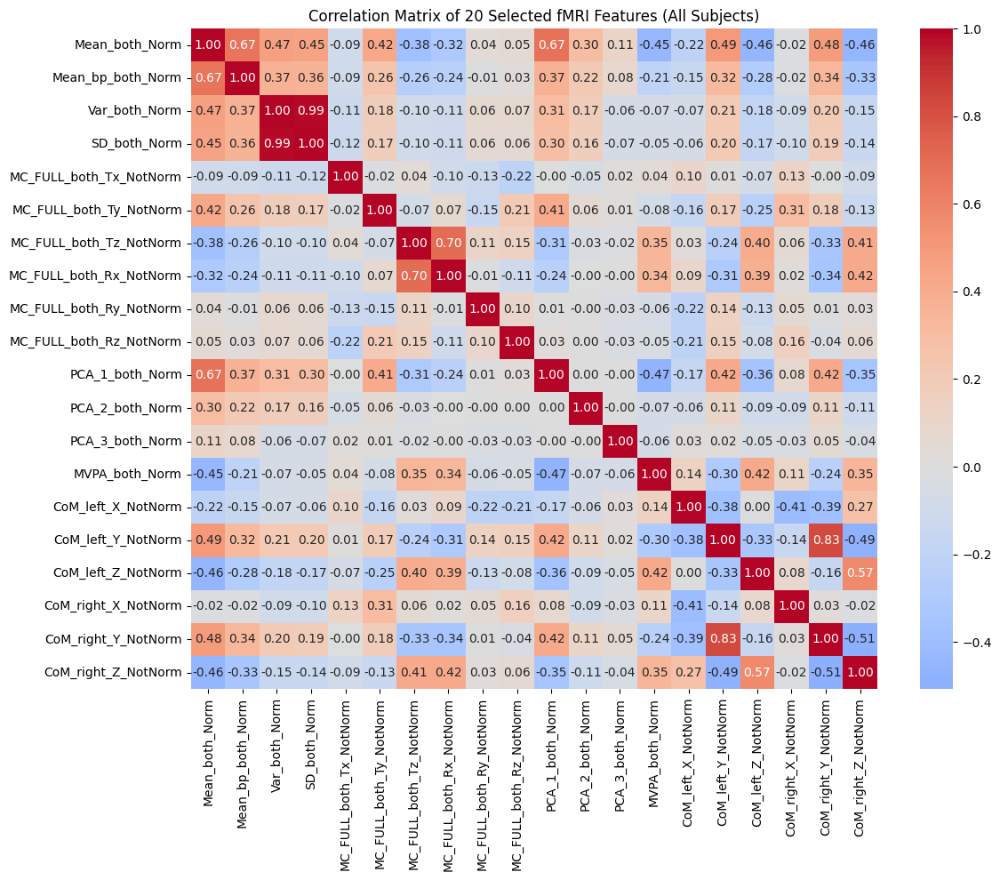

In [23]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# -----------------------------
# Columns to keep
# -----------------------------
fmri_cols = [
    'Mean_both_Norm', 'Mean_bp_both_Norm', 'Var_both_Norm', 'SD_both_Norm',
    'MC_FULL_both_Tx_NotNorm', 'MC_FULL_both_Ty_NotNorm', 'MC_FULL_both_Tz_NotNorm',
    'MC_FULL_both_Rx_NotNorm', 'MC_FULL_both_Ry_NotNorm', 'MC_FULL_both_Rz_NotNorm',
    'PCA_1_both_Norm', 'PCA_2_both_Norm', 'PCA_3_both_Norm', 'MVPA_both_Norm',
    'CoM_left_X_NotNorm', 'CoM_left_Y_NotNorm', 'CoM_left_Z_NotNorm',
    'CoM_right_X_NotNorm', 'CoM_right_Y_NotNorm', 'CoM_right_Z_NotNorm'
]

# -----------------------------
# Concatenate all subjects' time series
# -----------------------------
feature_series = {}  # feature -> concatenated time series

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")
    
    _, _, _, fmri_eye_df = loader.load_subject(subj_id)
    
    for feature in fmri_cols:
        ts = fmri_eye_df[feature].values
        if feature in feature_series:
            feature_series[feature] = np.concatenate([feature_series[feature], ts])
        else:
            feature_series[feature] = ts

# Create DataFrame for correlation
fmri_matrix = pd.DataFrame(feature_series)

# Compute correlation matrix
corr_matrix = fmri_matrix.corr()

# -----------------------------
# Plot correlation matrix
# -----------------------------
plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Matrix of 20 Selected fMRI Features (All Subjects)")
plt.tight_layout()
plt.show()


# 2 - How are they related to the Motion parameters? 

### Correlation matrix between the selected fMRIeye and head motion parameters

- MVPA and PCA_1 are the ones that are most related to the motion parameters
- Almost all parameters are at least weakly correlated with head motion
- SD and VAR are the most correlated with FD
- Mean has almost no correlation to head motion, although being 0.67 r correlated with PSA_1

In [61]:
import pandas as pd

# Clean column names
summary_df.columns = summary_df.columns.str.strip()

# 1. Filter MVPA_both_Norm
mvpa_df = summary_df[summary_df['Feature'] == 'Mean_bp_both_Norm']

# 2. Keep only translation and rotation parameters
mvpa_df = mvpa_df[mvpa_df['MotionParam'].str.startswith(('T', 'R'))]

# 3. Compute combined mean and SD
combined_stats = mvpa_df['median'].agg(mean='mean', sd='std')

combined_stats


mean    0.061076
sd      0.017773
Name: median, dtype: float64

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


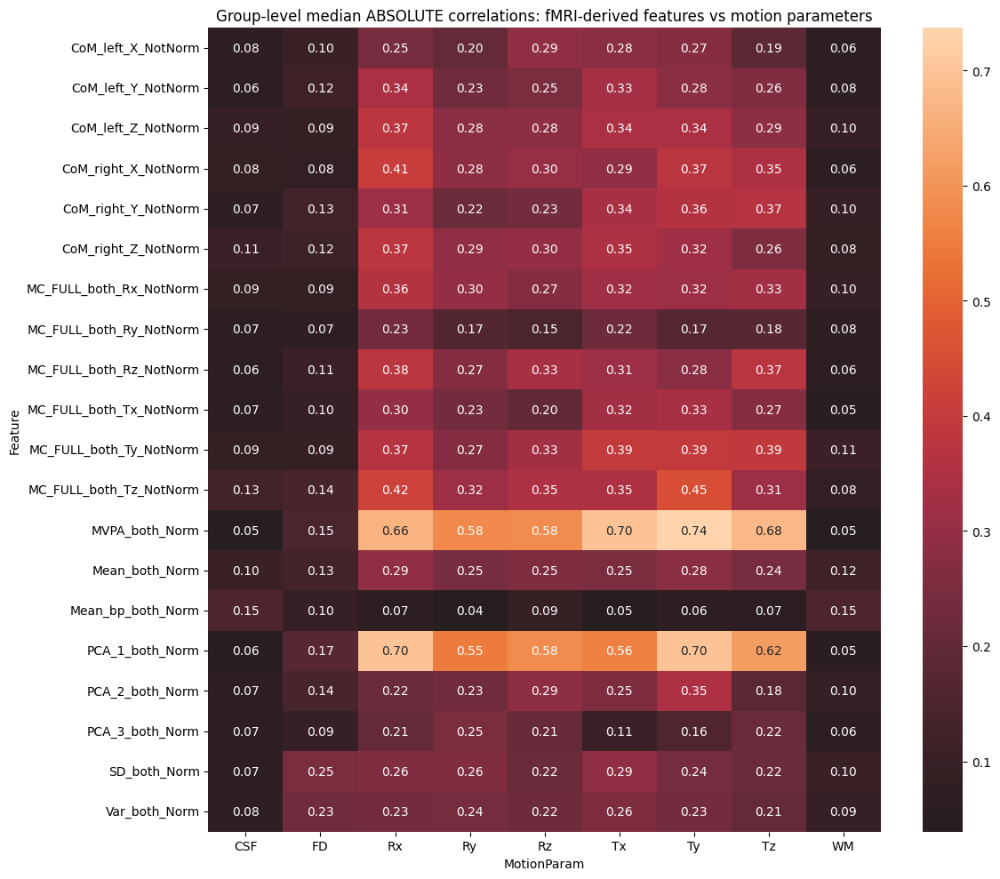

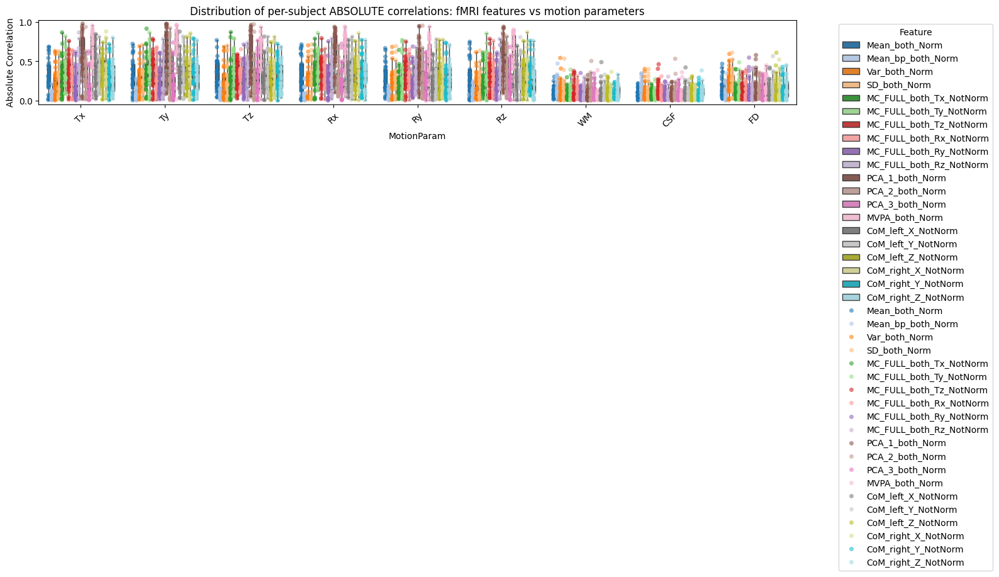

In [54]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# -----------------------------
# Settings
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# Columns to keep from fmri_eye_df
fmri_cols = [
    'Mean_both_Norm', 'Mean_bp_both_Norm', 'Var_both_Norm', 'SD_both_Norm',
    'MC_FULL_both_Tx_NotNorm', 'MC_FULL_both_Ty_NotNorm', 'MC_FULL_both_Tz_NotNorm',
    'MC_FULL_both_Rx_NotNorm', 'MC_FULL_both_Ry_NotNorm', 'MC_FULL_both_Rz_NotNorm',
    'PCA_1_both_Norm', 'PCA_2_both_Norm', 'PCA_3_both_Norm', 'MVPA_both_Norm',
    'CoM_left_X_NotNorm', 'CoM_left_Y_NotNorm', 'CoM_left_Z_NotNorm',
    'CoM_right_X_NotNorm', 'CoM_right_Y_NotNorm', 'CoM_right_Z_NotNorm'
]

# Motion parameters from ortvec_df
motion_cols = ['Tx', 'Ty', 'Tz', 'Rx', 'Ry', 'Rz', 'WM', 'CSF', 'FD']

# -----------------------------
# Collect per-subject correlations (absolute values)
# -----------------------------
all_corrs = []

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, _, _, fmri_eye_df = loader.load_subject(subj_id)

    # Keep only relevant columns
    fmri_df_sel = fmri_eye_df[fmri_cols].copy()
    motion_df_sel = ortvec_df[motion_cols].copy()

    # Z-score features per subject
    fmri_df_sel = (fmri_df_sel - fmri_df_sel.mean()) / fmri_df_sel.std()
    motion_df_sel = (motion_df_sel - motion_df_sel.mean()) / motion_df_sel.std()

    # Compute correlation: features vs motion parameters
    for feat in fmri_cols:
        for mot in motion_cols:
            corr_val = fmri_df_sel[feat].corr(motion_df_sel[mot])
            corr_val = abs(corr_val)  # <-- absolute value
            all_corrs.append({
                "Subject": subj_id,
                "Feature": feat,
                "MotionParam": mot,
                "Correlation": corr_val
            })

# -----------------------------
# Create DataFrame
# -----------------------------
corr_df = pd.DataFrame(all_corrs)

# -----------------------------
# Compute group-level summary statistics (median + IQR)
# -----------------------------
summary_df = corr_df.groupby(["Feature", "MotionParam"])["Correlation"].agg(['median']).reset_index()
q25 = corr_df.groupby(["Feature","MotionParam"])["Correlation"].quantile(0.25).reset_index(name="Q25")
q75 = corr_df.groupby(["Feature","MotionParam"])["Correlation"].quantile(0.75).reset_index(name="Q75")
summary_df = summary_df.merge(q25, on=["Feature","MotionParam"]).merge(q75, on=["Feature","MotionParam"])

# -----------------------------
# Heatmap of median absolute correlations
# -----------------------------
heat_df = summary_df.pivot(index="Feature", columns="MotionParam", values="median")

plt.figure(figsize=(12,10))
sns.heatmap(heat_df, annot=True, fmt=".2f", center=0)
plt.title("Group-level median ABSOLUTE correlations: fMRI-derived features vs motion parameters")
plt.tight_layout()
plt.show()

# -----------------------------
# Boxplot / dotplot for variability
# -----------------------------
plt.figure(figsize=(16,6))
sns.boxplot(
    data=corr_df,
    x="MotionParam",
    y="Correlation",
    hue="Feature",
    palette="tab20",
    showfliers=False
)
sns.stripplot(
    data=corr_df,
    x="MotionParam",
    y="Correlation",
    hue="Feature",
    dodge=True,
    marker="o",
    alpha=0.6,
    palette="tab20"
)
plt.xticks(rotation=45)
plt.ylabel("Absolute Correlation")
plt.title("Distribution of per-subject ABSOLUTE correlations: fMRI features vs motion parameters")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left', title="Feature")
plt.tight_layout()
plt.show()


Comments: The one that is the least affected by head motion AND still contain shared variance with other parameters is the Mean. 

# 3-  How are they related to the ET paramaters? 

### Correlation matrix between the ET parameters
- X and Y in visual degrees (ET_tr_x and ET_tr_y) do not seem to be correlated with gazeX and gazeY

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


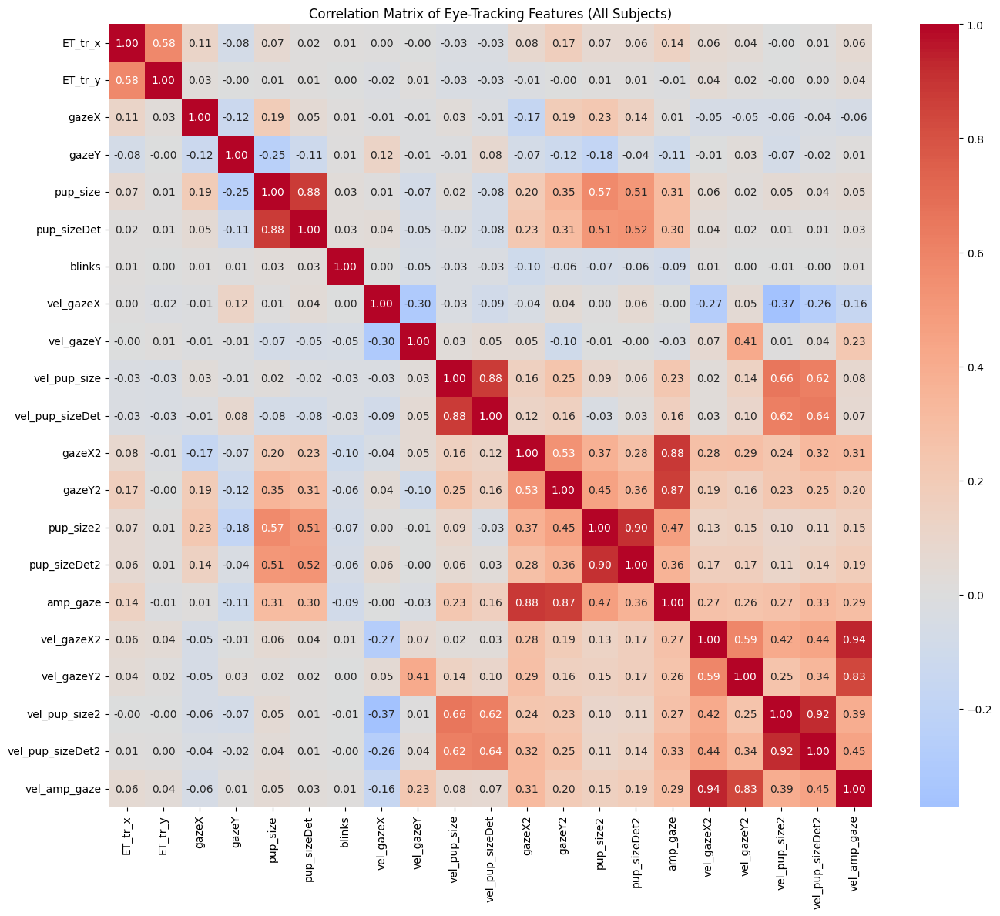

In [153]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# -----------------------------
# Eye-tracking columns
# -----------------------------
et_cols = [
    'ET_tr_x', 'ET_tr_y', 'gazeX', 'gazeY', 'pup_size', 'pup_sizeDet',
    'blinks', 'vel_gazeX', 'vel_gazeY', 'vel_pup_size', 'vel_pup_sizeDet',
    'gazeX2', 'gazeY2', 'pup_size2', 'pup_sizeDet2', 'amp_gaze',
    'vel_gazeX2', 'vel_gazeY2', 'vel_pup_size2', 'vel_pup_sizeDet2',
    'vel_amp_gaze'
]

# -----------------------------
# Concatenate all subjects' time series
# -----------------------------
et_series = {}  # feature -> concatenated time series

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")
    
    _, _, et_df, _ = loader.load_subject(subj_id)
    
    for feature in et_cols:
        ts = et_df[feature].values
        if feature in et_series:
            et_series[feature] = np.concatenate([et_series[feature], ts])
        else:
            et_series[feature] = ts

# Create DataFrame for correlation
et_matrix = pd.DataFrame(et_series)

# Optional: z-score normalize each feature across all time points
et_matrix = (et_matrix - et_matrix.mean()) / et_matrix.std()

# Compute correlation matrix
corr_matrix = et_matrix.corr()

# -----------------------------
# Plot correlation matrix
# -----------------------------
plt.figure(figsize=(14,12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Eye-Tracking Features (All Subjects)")
plt.tight_layout()
plt.show()


### Eye tracking parameters vs head-motion: 
- X and Y position in degrees weakly-moderately related to the head motion
- Parameters below vel form a clusters, as in the correlation matrix

Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


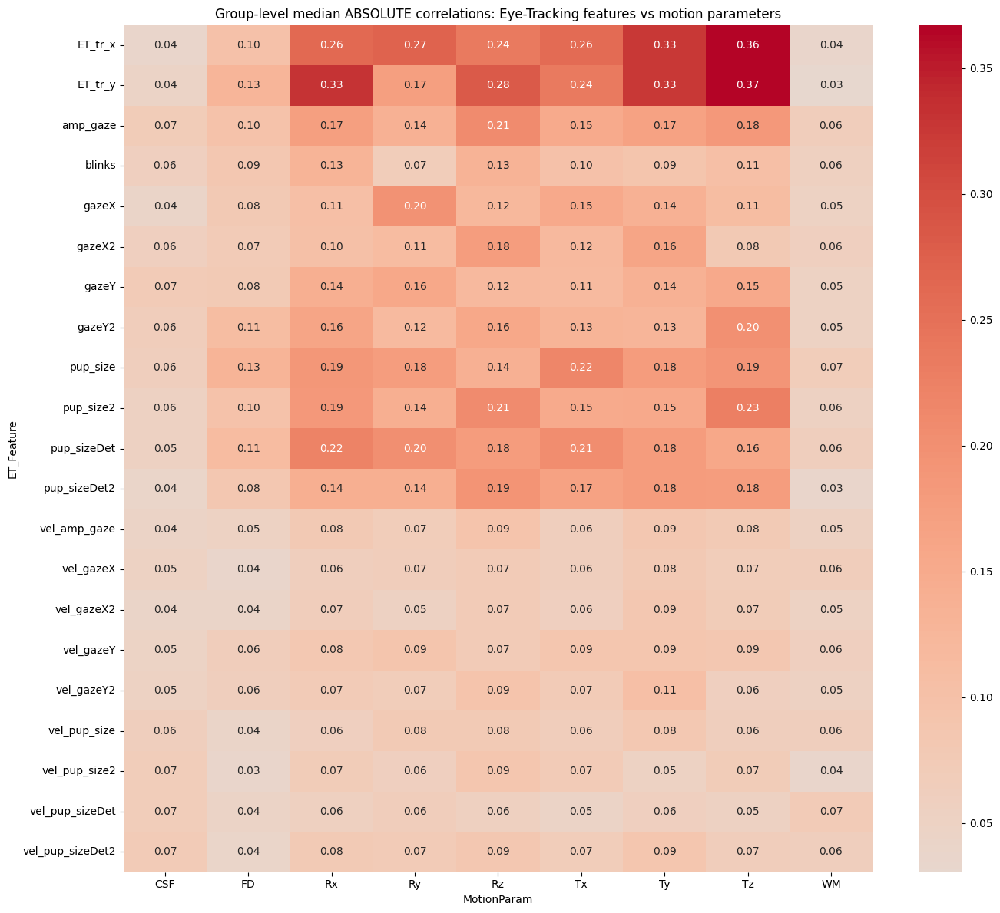

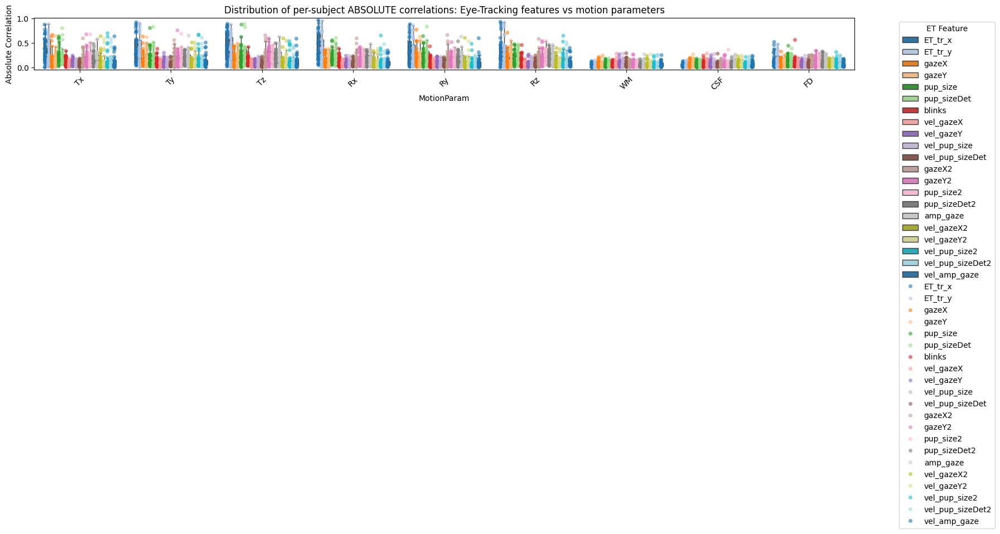

In [156]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# Settings
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

# Eye-tracking features
et_cols = [
    'ET_tr_x', 'ET_tr_y', 'gazeX', 'gazeY', 'pup_size', 'pup_sizeDet',
    'blinks', 'vel_gazeX', 'vel_gazeY', 'vel_pup_size', 'vel_pup_sizeDet',
    'gazeX2', 'gazeY2', 'pup_size2', 'pup_sizeDet2', 'amp_gaze',
    'vel_gazeX2', 'vel_gazeY2', 'vel_pup_size2', 'vel_pup_sizeDet2',
    'vel_amp_gaze'
]

# Motion parameters
motion_cols = ['Tx', 'Ty', 'Tz', 'Rx', 'Ry', 'Rz', 'WM', 'CSF', 'FD']

# -----------------------------
# Collect per-subject correlations (absolute values)
# -----------------------------
all_corrs = []

for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, _, et_df, _ = loader.load_subject(subj_id)

    et_sel = et_df[et_cols].copy()
    motion_sel = ortvec_df[motion_cols].copy()

    # Z-score per subject
    et_sel = (et_sel - et_sel.mean()) / et_sel.std()
    motion_sel = (motion_sel - motion_sel.mean()) / motion_sel.std()

    # Correlate each eye-tracking feature with each motion parameter
    for feat in et_cols:
        for mot in motion_cols:
            corr_val = et_sel[feat].corr(motion_sel[mot])
            corr_val = abs(corr_val)  # absolute correlation
            all_corrs.append({
                "Subject": subj_id,
                "ET_Feature": feat,
                "MotionParam": mot,
                "Correlation": corr_val
            })

# -----------------------------
# Create DataFrame
# -----------------------------
corr_df = pd.DataFrame(all_corrs)

# -----------------------------
# Compute group-level median and IQR
# -----------------------------
median_df = corr_df.groupby(["ET_Feature", "MotionParam"])["Correlation"].median().reset_index(name="median")
q25_df = corr_df.groupby(["ET_Feature", "MotionParam"])["Correlation"].quantile(0.25).reset_index(name="Q25")
q75_df = corr_df.groupby(["ET_Feature", "MotionParam"])["Correlation"].quantile(0.75).reset_index(name="Q75")

summary_df = median_df.merge(q25_df, on=["ET_Feature","MotionParam"]).merge(q75_df, on=["ET_Feature","MotionParam"])

# Now pivot works correctly
heat_df = summary_df.pivot(index="ET_Feature", columns="MotionParam", values="median")

# -----------------------------
# Heatmap of median absolute correlations
# -----------------------------
heat_df = summary_df.pivot(index="ET_Feature", columns="MotionParam", values="median")

plt.figure(figsize=(14,12))
sns.heatmap(heat_df, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Group-level median ABSOLUTE correlations: Eye-Tracking features vs motion parameters")
plt.tight_layout()
plt.show()

# -----------------------------
# Boxplot / dotplot for variability
# -----------------------------
plt.figure(figsize=(18,6))
sns.boxplot(
    data=corr_df,
    x="MotionParam",
    y="Correlation",
    hue="ET_Feature",
    palette="tab20",
    showfliers=False
)
sns.stripplot(
    data=corr_df,
    x="MotionParam",
    y="Correlation",
    hue="ET_Feature",
    dodge=True,
    marker="o",
    alpha=0.6,
    palette="tab20"
)
plt.xticks(rotation=45)
plt.ylabel("Absolute Correlation")
plt.title("Distribution of per-subject ABSOLUTE correlations: Eye-Tracking features vs motion parameters")
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left', title="ET Feature")
plt.tight_layout()
plt.show()


### Partial R2: variance explained the ET metrics by fMRIeye metrics, controlling for motion

In [89]:
import pandas as pd

# Select ET_tr_x and ET_tr_y
et_df = big_df.loc[pd.IndexSlice[:, ['ET_tr_x', 'ET_tr_y']], :]

# Mean and SD of R² across subjects for each column
r2_stats = et_df.groupby(level='et_col').agg(['mean', 'std'])

print(r2_stats)


        CoM_right_X_NotNorm           CoM_right_Y_NotNorm            \
                       mean       std                mean       std   
et_col                                                                
ET_tr_x            0.079286  0.137860            0.084381  0.133698   
ET_tr_y            0.072672  0.108112            0.074700  0.124452   

        CoM_right_Z_NotNorm           MC_FULL_right_Rx_NotNorm            \
                       mean       std                     mean       std   
et_col                                                                     
ET_tr_x            0.086227  0.127566                 0.058589  0.094734   
ET_tr_y            0.081303  0.139557                 0.047366  0.070629   

        MC_FULL_right_Ry_NotNorm            ... PCA_1_right_Norm            \
                            mean       std  ...             mean       std   
et_col                                      ...                              
ET_tr_x                 0.055

In [92]:
r2_stats['MVPA_right_Norm']

,mean,std
et_col,,
ET_tr_x,0.202527,0.219648
ET_tr_y,0.219432,0.222414


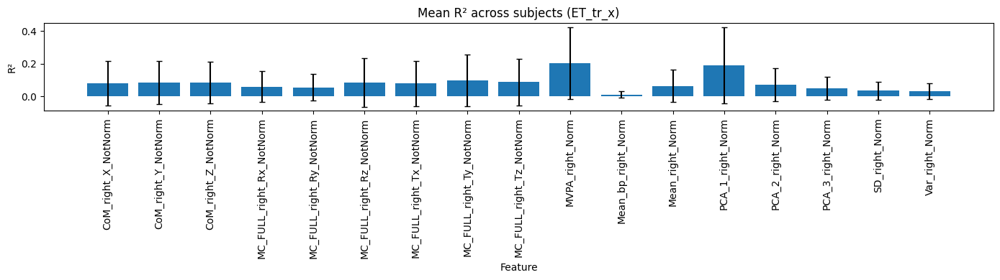

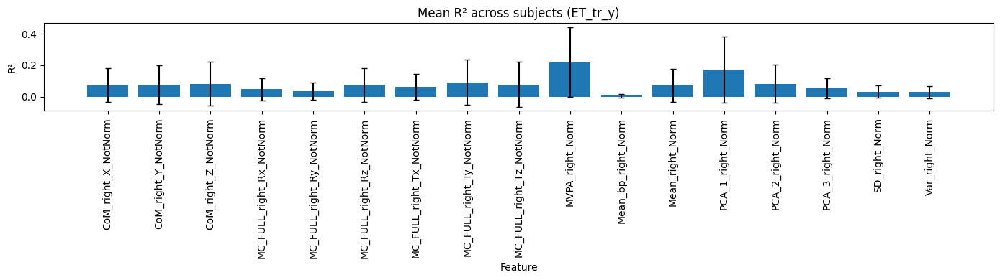

In [75]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Select ET_tr_x and ET_tr_y
et_df = big_df.loc[pd.IndexSlice[:, ['ET_tr_x', 'ET_tr_y']], :]

# 2. Compute mean and SD across subjects for each column
r2_stats = et_df.groupby(level='et_col').agg(['mean', 'std'])

# 3. Plot
for et in r2_stats.index:
    means = r2_stats.loc[et].xs('mean', level=1)
    stds  = r2_stats.loc[et].xs('std',  level=1)

    plt.figure(figsize=(14, 4))
    plt.bar(means.index, means.values, yerr=stds.values, capsize=3)
    plt.title(f"Mean R² across subjects ({et})")
    plt.ylabel("R²")
    plt.xlabel("Feature")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/scipy/stats/_stats_py.py:9638: RuntimeWarning: divide by zero encountered in log
  statistic = -2 * np.sum(np.log(pvalues))


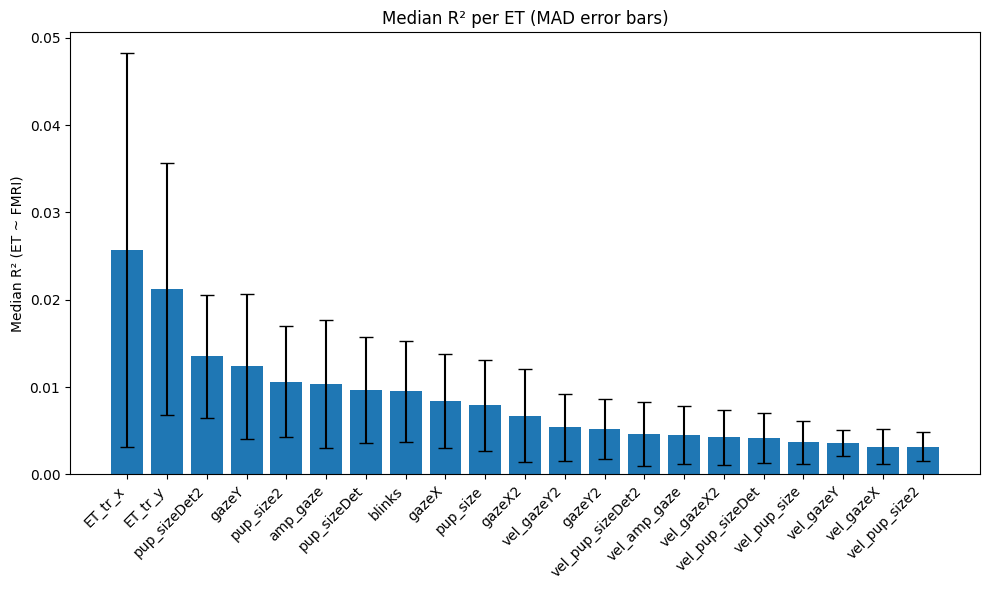

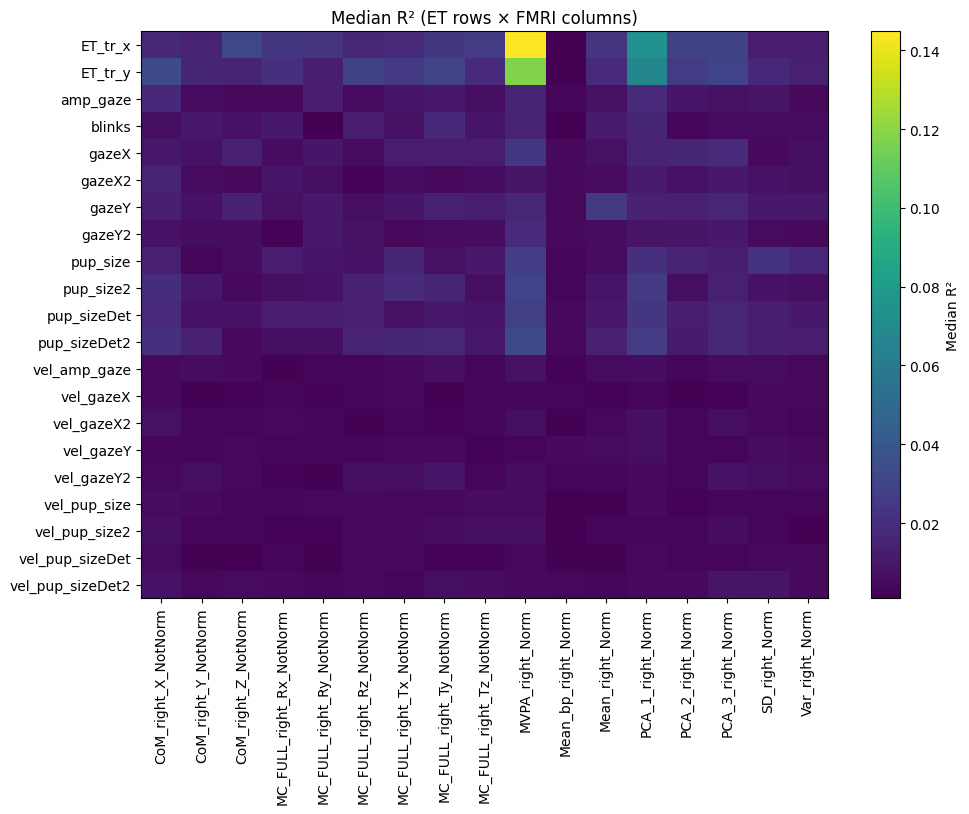

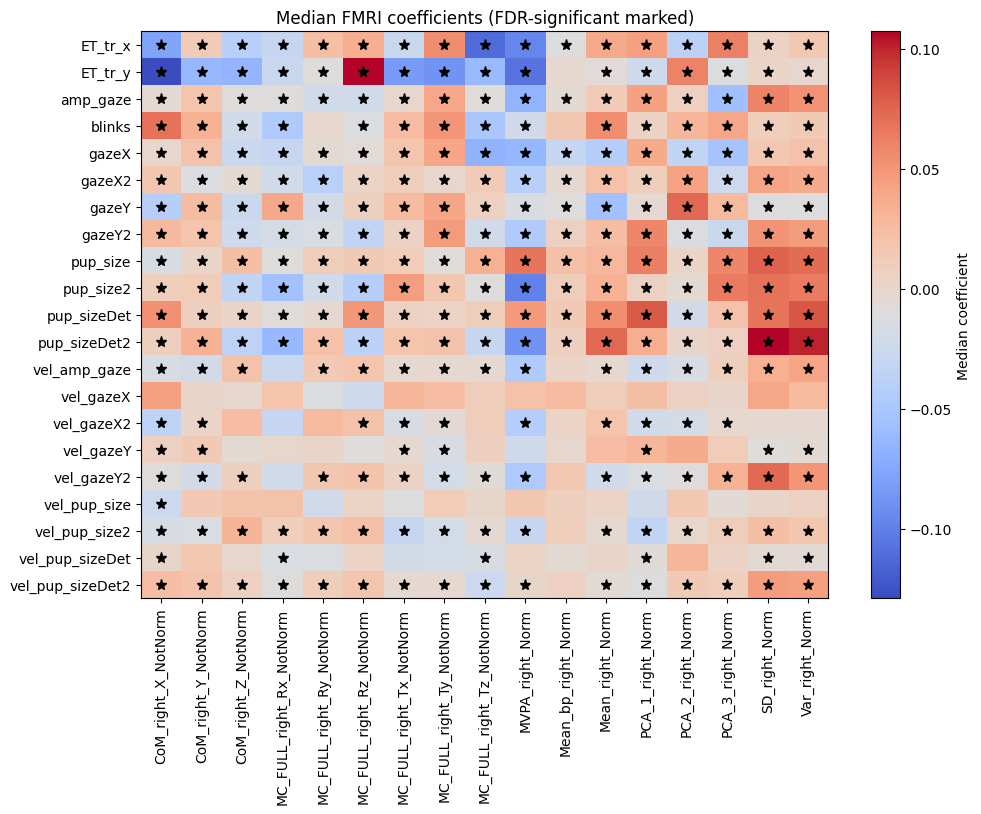

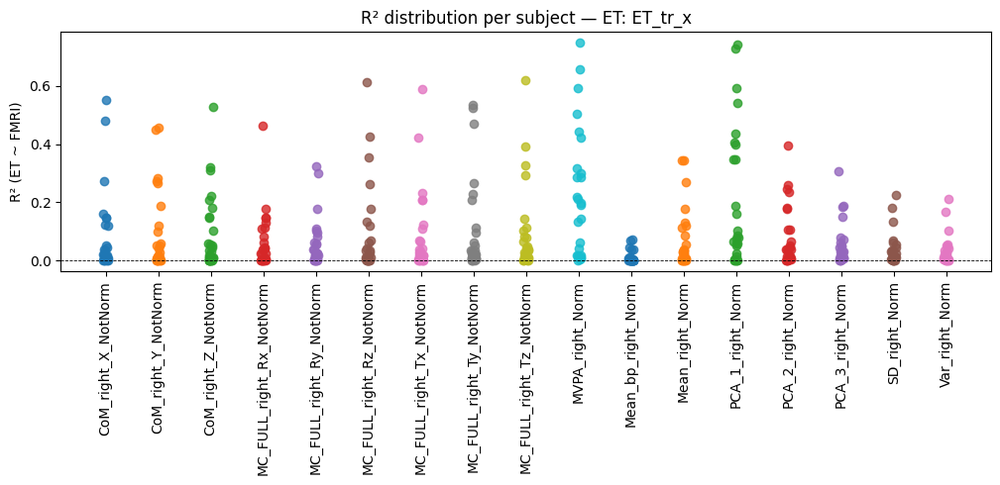

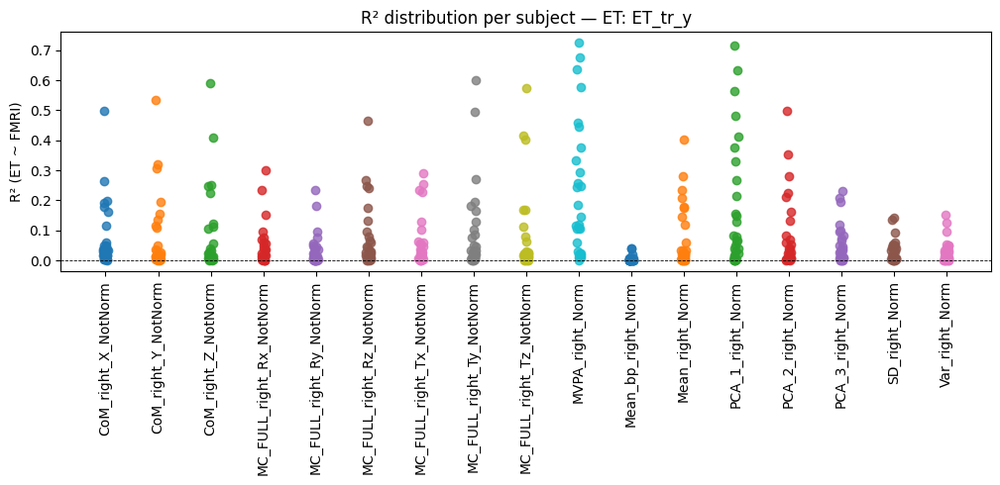

...

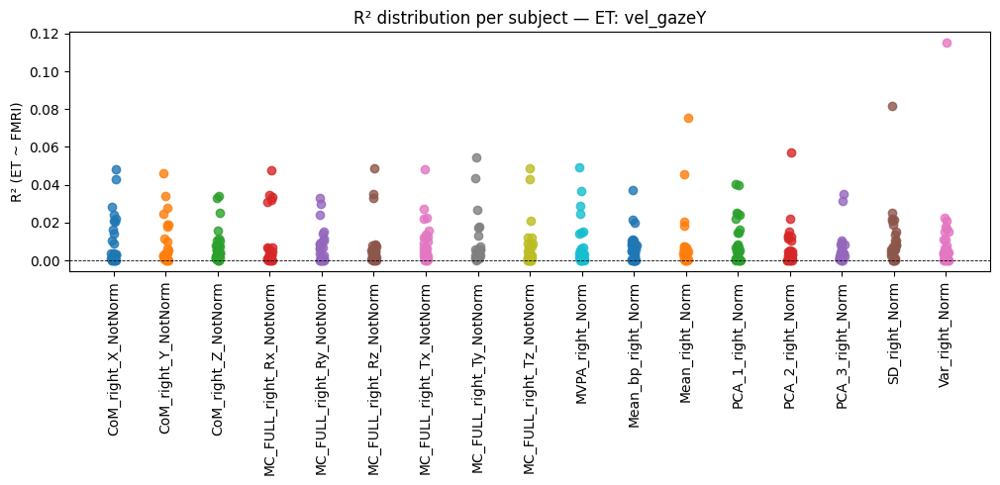

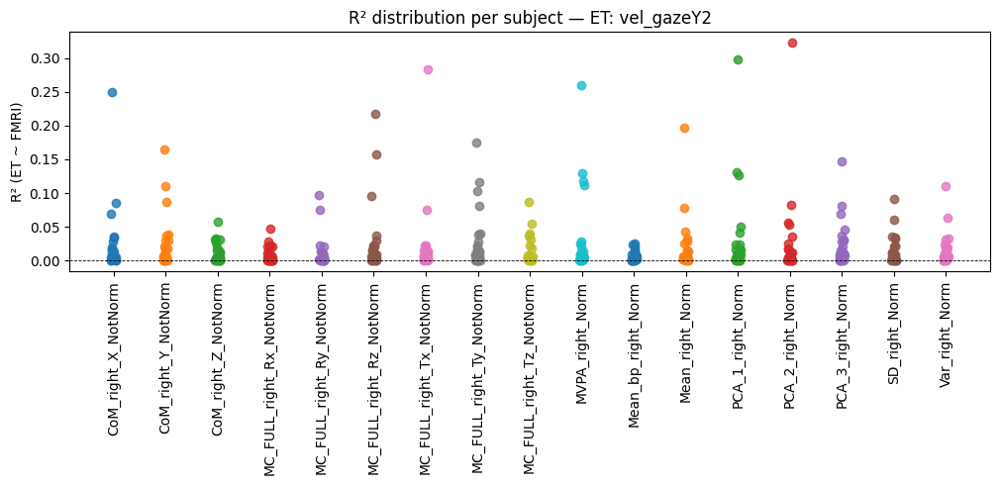

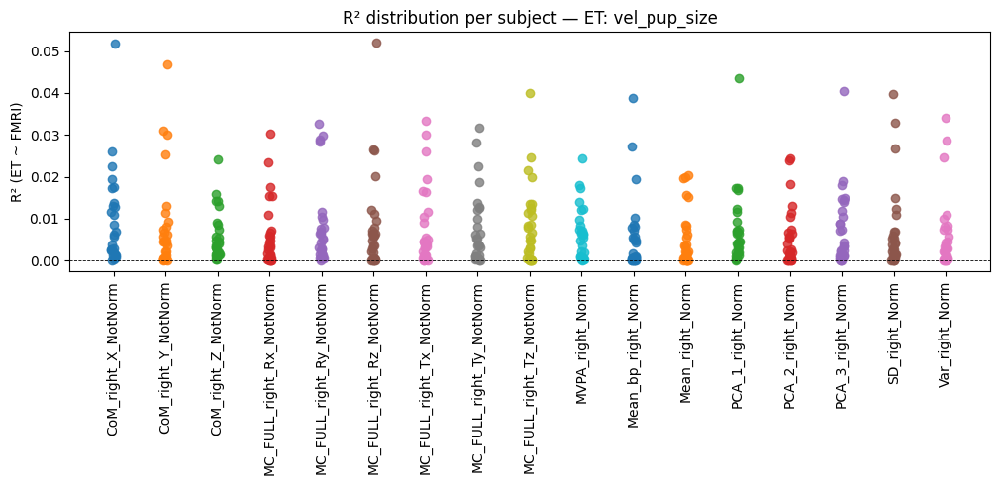

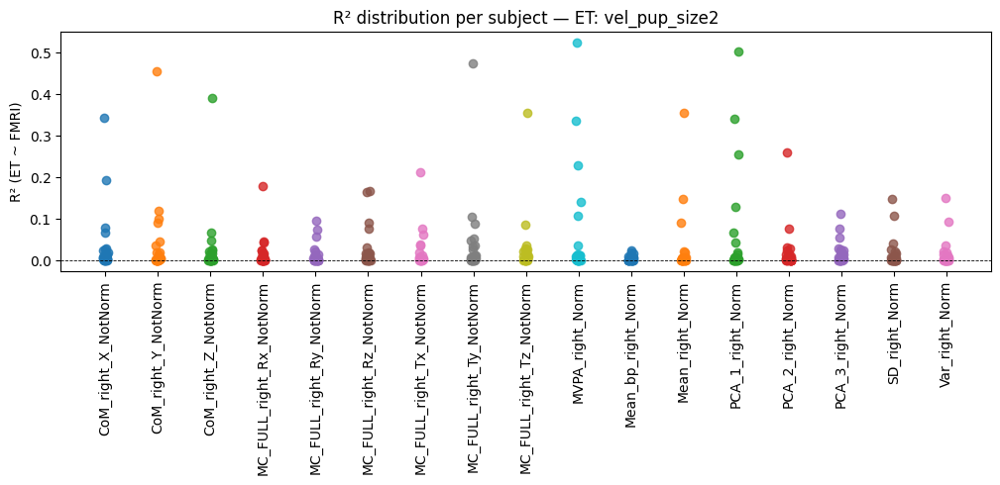

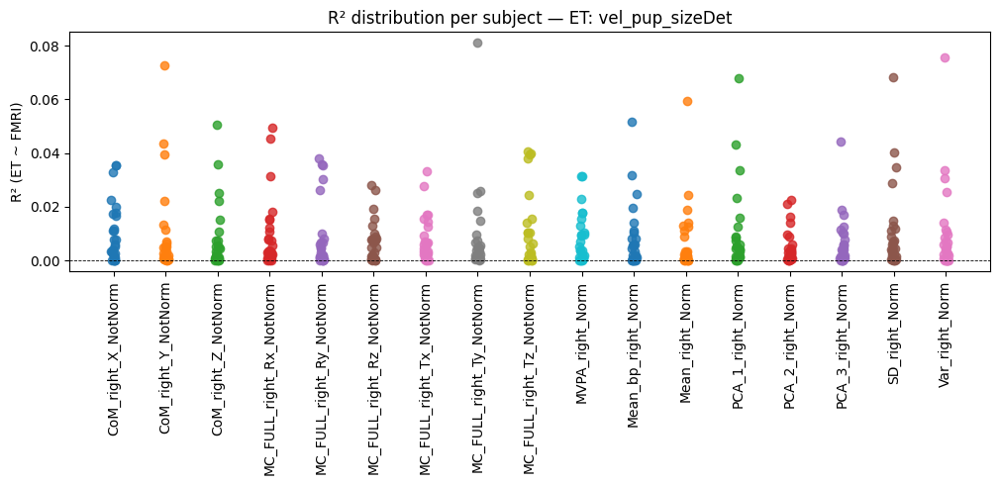

Done. R², coefficients, p-values, and FDR significance computed, plotted, and saved.


In [93]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import combine_pvalues
from statsmodels.stats.multitest import multipletests

# -----------------------------
# Settings (adjust paths / loader)
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()  # replace with your actual loader

fmri_cols = [
 'Mean_right_Norm', 'Mean_bp_right_Norm', 'Var_right_Norm', 'SD_right_Norm',
 'MC_FULL_right_Tx_NotNorm','MC_FULL_right_Ty_NotNorm','MC_FULL_right_Tz_NotNorm',
 'MC_FULL_right_Rx_NotNorm','MC_FULL_right_Ry_NotNorm','MC_FULL_right_Rz_NotNorm',
 'PCA_1_right_Norm','PCA_2_right_Norm','PCA_3_right_Norm','MVPA_right_Norm',
 'CoM_right_X_NotNorm','CoM_right_Y_NotNorm','CoM_right_Z_NotNorm'
]

scaler = StandardScaler()

# -----------------------------
# Containers
# -----------------------------
per_subject_r2 = []
per_subject_coef = []
per_subject_pval = []
subjects_seen = []

# -----------------------------
# Loop over subjects
# -----------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, _, et_df, fmri_eye_df = loader.load_subject(subj_id)
    ortvec_df.drop('WM',axis=1)
    ortvec_df.drop('CSF',axis=1)

    fmri_df = fmri_eye_df.loc[:, [c for c in fmri_cols if c in fmri_eye_df.columns]].copy()
    et_df = et_df.copy()

    if fmri_df.shape[1] == 0 or et_df.shape[1] == 0:
        print(f"Skipping subject {subj_id}: no FMRI or ET columns remaining.")
        continue

    # Z-score
    fmri_z = pd.DataFrame(scaler.fit_transform(fmri_df.fillna(np.nan)),
                          columns=fmri_df.columns, index=fmri_df.index)
    et_z = pd.DataFrame(scaler.fit_transform(et_df.fillna(np.nan)),
                        columns=et_df.columns, index=et_df.index)

    r2_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)
    coef_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)
    pval_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)

    # Compute R², coefficient, p-value
    for et_col in et_z.columns:
        y = et_z[et_col]
        for fmri_col in fmri_z.columns:
            df = pd.concat([y, fmri_z[[fmri_col]]], axis=1).dropna()
            if df.shape[0] < 3:
                r2_mat.loc[et_col, fmri_col] = np.nan
                coef_mat.loc[et_col, fmri_col] = np.nan
                pval_mat.loc[et_col, fmri_col] = np.nan
                continue

            X = df[[fmri_col]].values
            Y = df[et_col].values
            lm = LinearRegression().fit(X,Y)
            y_pred = lm.predict(X)
            residuals = Y - y_pred
            n = len(Y)
            se = np.sqrt(np.sum(residuals**2)/(n-2)) / np.sqrt(np.sum((X[:,0]-X[:,0].mean())**2))
            t_val = lm.coef_[0] / se
            pval = 2 * (1 - stats.t.cdf(np.abs(t_val), df=n-2))

            r2_mat.loc[et_col, fmri_col] = lm.score(X,Y)
            coef_mat.loc[et_col, fmri_col] = lm.coef_[0]
            pval_mat.loc[et_col, fmri_col] = pval

    per_subject_r2.append(r2_mat)
    per_subject_coef.append(coef_mat)
    per_subject_pval.append(pval_mat)
    subjects_seen.append(subj_id)

# -----------------------------
# Aggregate across subjects
# -----------------------------
if len(per_subject_r2) == 0:
    raise RuntimeError("No subjects processed.")

all_fmri_cols = sorted({c for m in per_subject_r2 for c in m.columns})
all_et_cols   = sorted({c for m in per_subject_r2 for c in m.index})

# R²
aligned_r2 = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_r2]
concat_r2_list = []
for subj, mat in zip(subjects_seen, aligned_r2):
    df = mat.copy()
    df["subject"] = subj
    df["et_col"] = df.index
    concat_r2_list.append(df.reset_index(drop=True).set_index(["subject","et_col"]))
big_df = pd.concat(concat_r2_list, axis=0).sort_index()
median_matrix = big_df.groupby(level="et_col").median()

# Coefficients
aligned_coef = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_coef]
concat_coef_list = []
for subj, mat in zip(subjects_seen, aligned_coef):
    df = mat.copy()
    df["subject"] = subj
    df["et_col"] = df.index
    concat_coef_list.append(df.reset_index(drop=True).set_index(["subject","et_col"]))
big_coef_df = pd.concat(concat_coef_list, axis=0).sort_index()
median_coef_matrix = big_coef_df.groupby(level="et_col").median()

# P-values: combine across subjects using Fisher
aligned_pval = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_pval]
median_pval_matrix = pd.DataFrame(index=all_et_cols, columns=all_fmri_cols, dtype=float)
for et_col in all_et_cols:
    for fmri_col in all_fmri_cols:
        vals = [m.loc[et_col,fmri_col] for m in aligned_pval if not pd.isna(m.loc[et_col,fmri_col])]
        if len(vals)==0:
            median_pval_matrix.loc[et_col,fmri_col] = np.nan
            continue
        _, combined_p = combine_pvalues(vals, method='fisher')
        median_pval_matrix.loc[et_col,fmri_col] = combined_p

# FDR correction
pvals_flat = median_pval_matrix.values.flatten()
mask_nan = ~np.isnan(pvals_flat)
pvals_to_correct = pvals_flat[mask_nan]
reject, pvals_corrected, _, _ = multipletests(pvals_to_correct, alpha=0.05, method='fdr_bh')
sig_mask = np.zeros_like(pvals_flat, dtype=bool)
sig_mask[mask_nan] = reject
sig_mask = sig_mask.reshape(median_pval_matrix.shape)

# -----------------------------
# Bar plot values (median ± MAD)
# -----------------------------
per_subj_agg = big_df.median(axis=1)
median_per_et = per_subj_agg.groupby(level="et_col").median()
mad_per_et = per_subj_agg.groupby(level="et_col").apply(lambda x: np.median(np.abs(x-np.median(x))))

# -----------------------------
# PLOTS
# -----------------------------
# 1) Bar plot with MAD
plt.figure(figsize=(10,6))
order = median_per_et.sort_values(ascending=False).index
vals = median_per_et.loc[order].values
errs = mad_per_et.loc[order].values
plt.bar(range(len(order)), vals, yerr=errs, capsize=5)
plt.xticks(range(len(order)), order, rotation=45, ha="right")
plt.ylabel("Median R² (ET ~ FMRI)")
plt.title("Median R² per ET (MAD error bars)")
plt.tight_layout()
plt.show()

# 2) Heatmap: median R²
plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6), max(6,len(all_et_cols)*0.25+3)))
plt.imshow(median_matrix.values, aspect="auto", interpolation="nearest")
plt.colorbar(label="Median R²")
plt.xticks(range(len(all_fmri_cols)), all_fmri_cols, rotation=90)
plt.yticks(range(len(all_et_cols)), all_et_cols)
plt.title("Median R² (ET rows × FMRI columns)")
plt.tight_layout()
plt.show()

# 3) Heatmap: median coefficients with FDR significance
plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6), max(6,len(all_et_cols)*0.25+3)))
plt.imshow(median_coef_matrix.values, aspect="auto", interpolation="nearest", cmap="coolwarm")
plt.colorbar(label="Median coefficient")
plt.xticks(range(len(all_fmri_cols)), all_fmri_cols, rotation=90)
plt.yticks(range(len(all_et_cols)), all_et_cols)
plt.title("Median FMRI coefficients (FDR-significant marked)")
# overlay significant cells
for i in range(len(all_et_cols)):
    for j in range(len(all_fmri_cols)):
        if sig_mask[i,j]:
            plt.plot(j,i,'k*',markersize=8)
plt.tight_layout()
plt.show()

# 4) Dot plots: per-subject R² distributions
max_et_plots = 20
plot_ets = all_et_cols[:max_et_plots]
for et_col in plot_ets:
    plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6),5))
    subdf = big_df.xs(et_col, level="et_col")
    xs = np.arange(len(all_fmri_cols))
    for i, fmri_col in enumerate(all_fmri_cols):
        vals = subdf[fmri_col].dropna().values
        if len(vals)==0: continue
        jitter = (np.random.rand(len(vals))-0.5)*0.1
        plt.plot(xs[i]+jitter, vals, "o", markersize=6, alpha=0.8)
    plt.xticks(xs, all_fmri_cols, rotation=90)
    plt.axhline(0, color="k", linewidth=0.6, linestyle="--")
    plt.ylabel("R² (ET ~ FMRI)")
    plt.title(f"R² distribution per subject — ET: {et_col}")
    plt.tight_layout()
    plt.show()

# -----------------------------
# Save outputs
# -----------------------------
median_matrix.to_csv("median_r2_matrix_no_motion.csv")
big_df.to_csv("per_subject_r2_no_motion.csv")
median_coef_matrix.to_csv("median_coef_matrix_no_motion.csv")
big_coef_df.to_csv("per_subject_coef_no_motion.csv")
median_pval_matrix.to_csv("median_pval_matrix_no_motion.csv")

flat_r2 = big_df.reset_index().melt(id_vars=["subject","et_col"], var_name="fmri_col", value_name="r2")
flat_r2.to_csv("r2_longformat_no_motion.csv", index=False)

flat_coef = big_coef_df.reset_index().melt(id_vars=["subject","et_col"], var_name="fmri_col", value_name="coef")
flat_coef.to_csv("coef_longformat_no_motion.csv", index=False)

print("Done. R², coefficients, p-values, and FDR significance computed, plotted, and saved.")


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/scipy/stats/_stats_py.py:9638: RuntimeWarning: divide by zero encountered in log
  statistic = -2 * np.sum(np.log(pvalues))


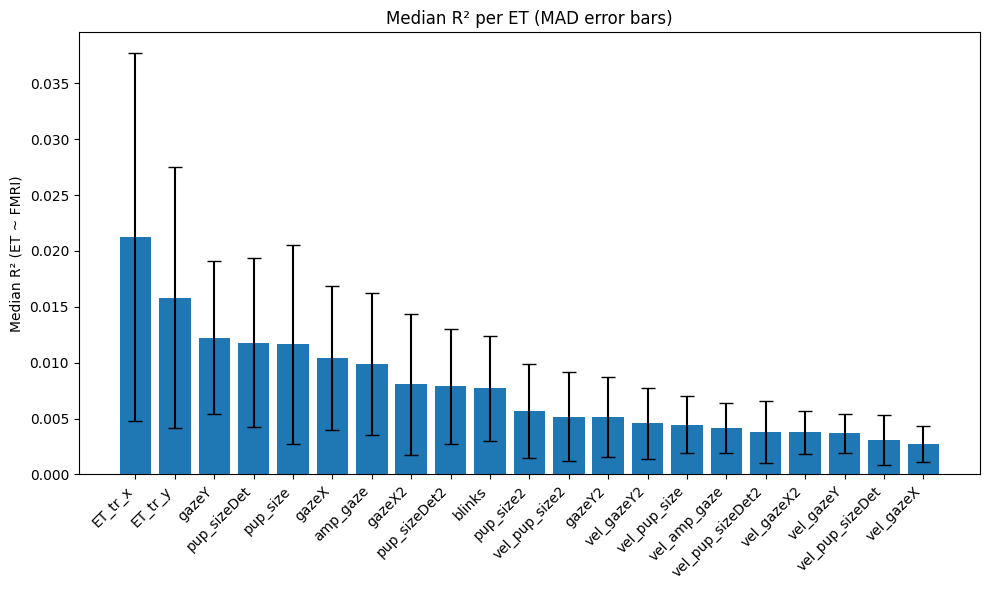

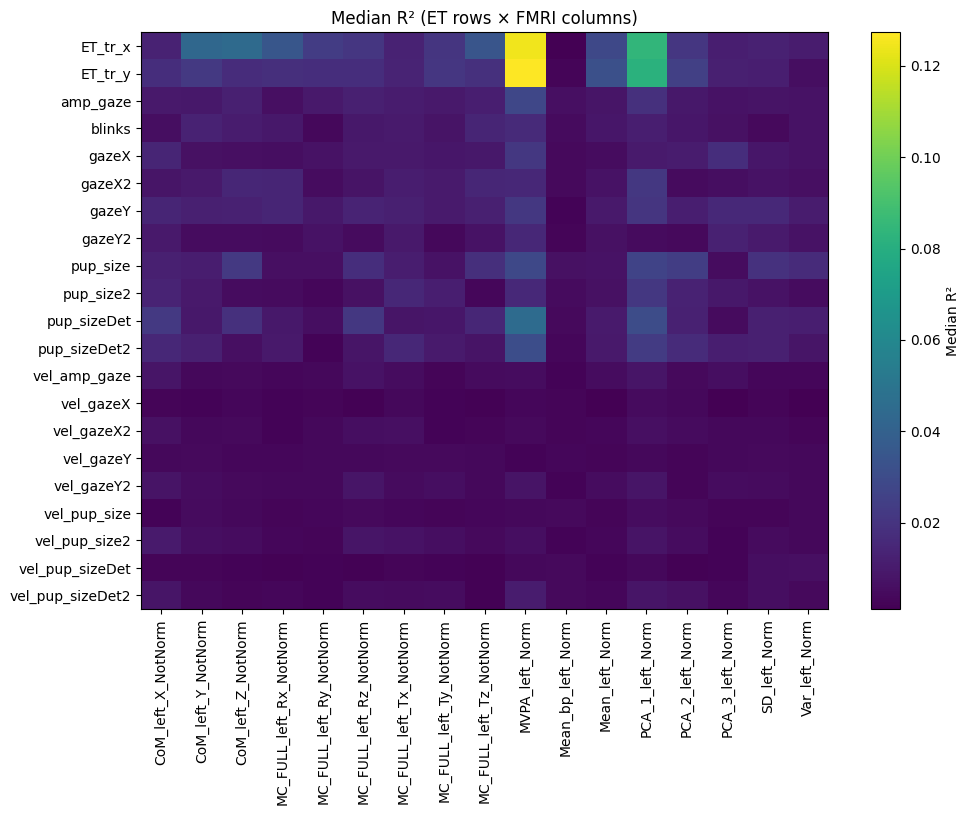

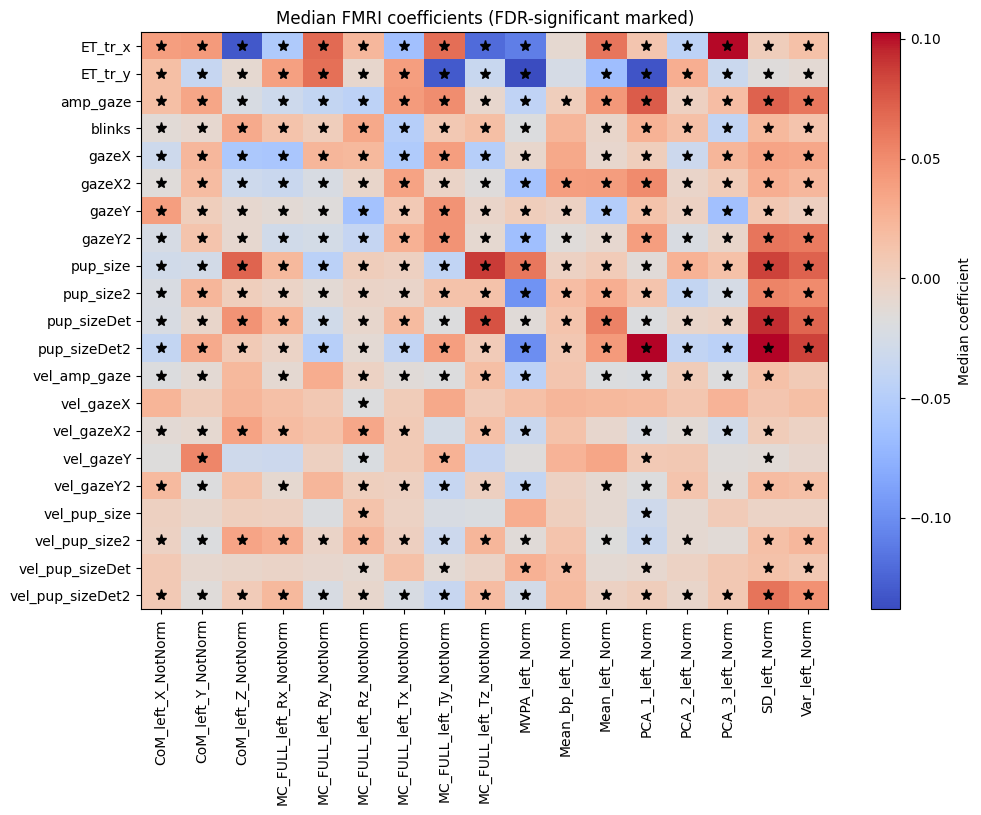

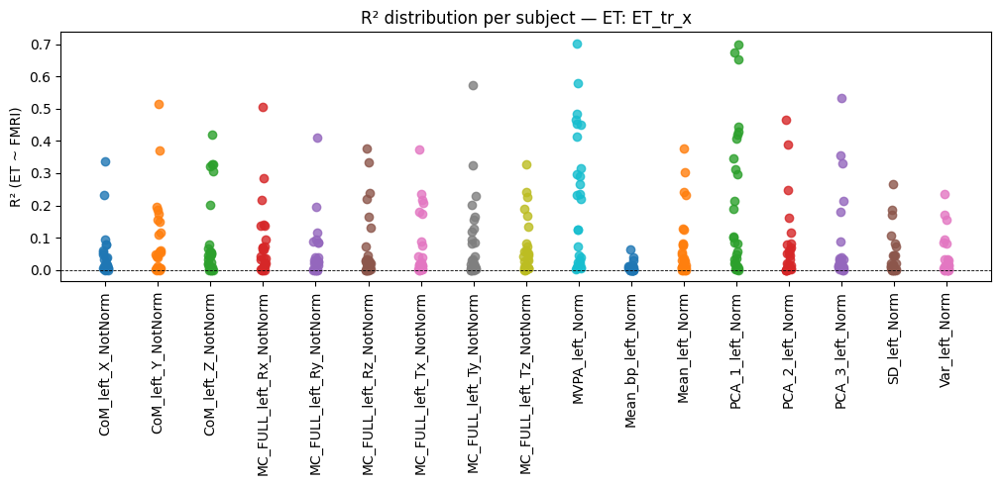

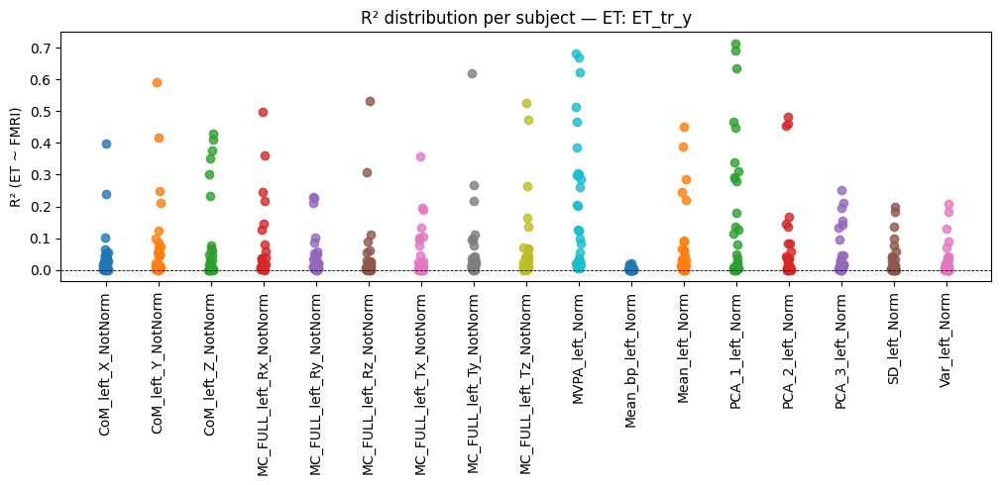

...

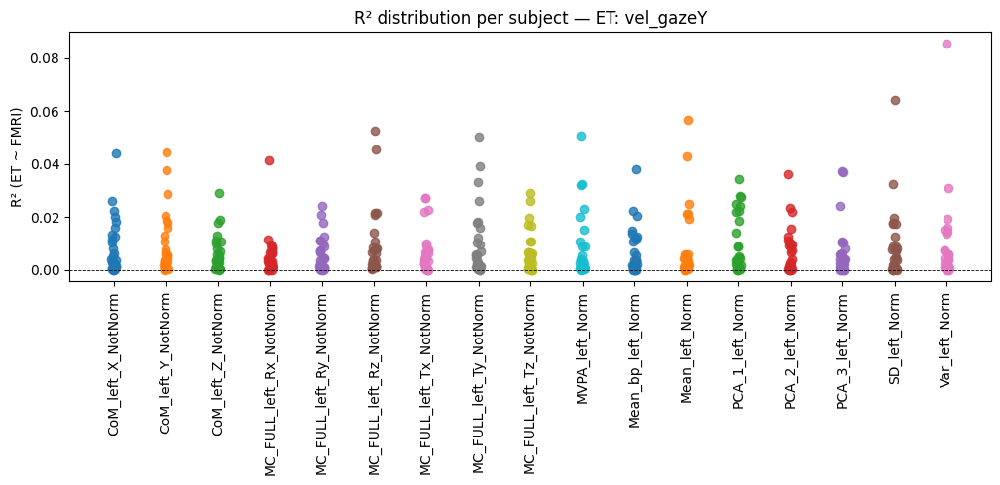

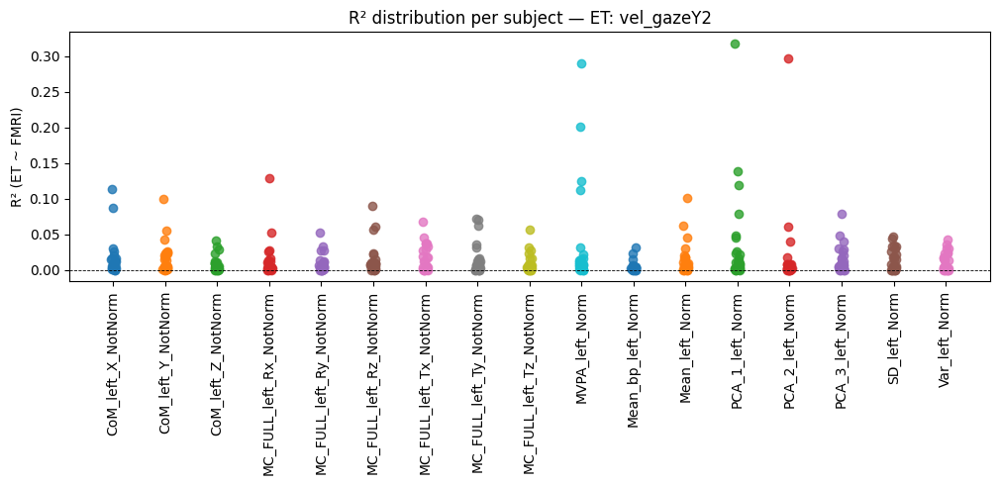

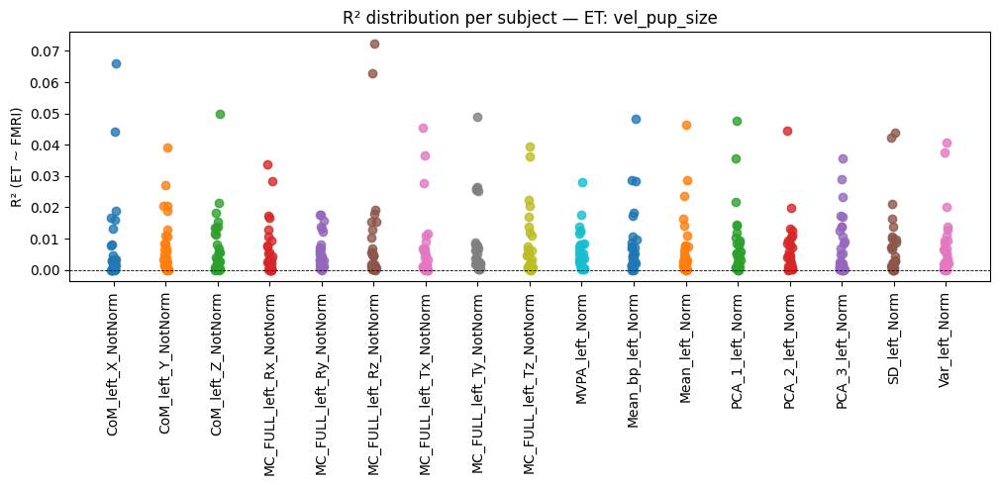

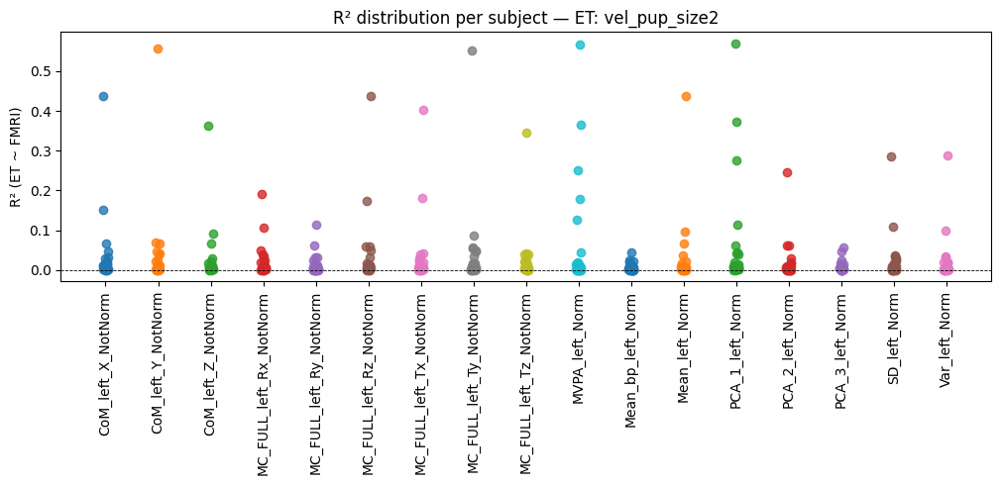

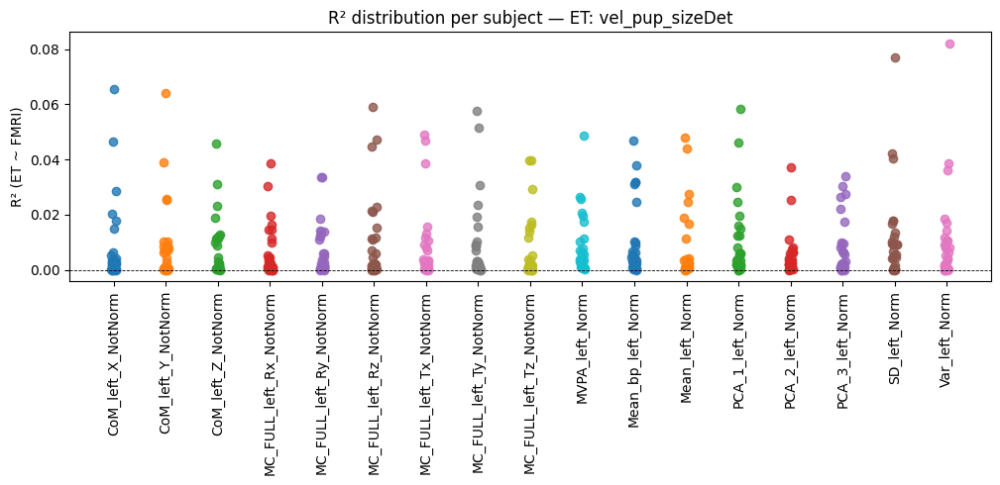

Done. R², coefficients, p-values, and FDR significance computed, plotted, and saved.


In [75]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import combine_pvalues
from statsmodels.stats.multitest import multipletests

# -----------------------------
# Settings (adjust paths / loader)
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()  # replace with your actual loader

fmri_cols = [
 'Mean_left_Norm', 'Mean_bp_left_Norm', 'Var_left_Norm', 'SD_left_Norm',
 'MC_FULL_left_Tx_NotNorm','MC_FULL_left_Ty_NotNorm','MC_FULL_left_Tz_NotNorm',
 'MC_FULL_left_Rx_NotNorm','MC_FULL_left_Ry_NotNorm','MC_FULL_left_Rz_NotNorm',
 'PCA_1_left_Norm','PCA_2_left_Norm','PCA_3_left_Norm','MVPA_left_Norm',
 'CoM_left_X_NotNorm','CoM_left_Y_NotNorm','CoM_left_Z_NotNorm'
]

scaler = StandardScaler()

# -----------------------------
# Containers
# -----------------------------
per_subject_r2 = []
per_subject_coef = []
per_subject_pval = []
subjects_seen = []

# -----------------------------
# Loop over subjects
# -----------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, _, et_df, fmri_eye_df = loader.load_subject(subj_id)
    ortvec_df.drop('WM',axis=1)
    ortvec_df.drop('CSF',axis=1)

    fmri_df = fmri_eye_df.loc[:, [c for c in fmri_cols if c in fmri_eye_df.columns]].copy()
    et_df = et_df.copy()

    if fmri_df.shape[1] == 0 or et_df.shape[1] == 0:
        print(f"Skipping subject {subj_id}: no FMRI or ET columns remaining.")
        continue

    # Z-score
    fmri_z = pd.DataFrame(scaler.fit_transform(fmri_df.fillna(np.nan)),
                          columns=fmri_df.columns, index=fmri_df.index)
    et_z = pd.DataFrame(scaler.fit_transform(et_df.fillna(np.nan)),
                        columns=et_df.columns, index=et_df.index)

    r2_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)
    coef_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)
    pval_mat = pd.DataFrame(index=et_z.columns, columns=fmri_z.columns, dtype=float)

    # Compute R², coefficient, p-value
    for et_col in et_z.columns:
        y = et_z[et_col]
        for fmri_col in fmri_z.columns:
            df = pd.concat([y, fmri_z[[fmri_col]]], axis=1).dropna()
            if df.shape[0] < 3:
                r2_mat.loc[et_col, fmri_col] = np.nan
                coef_mat.loc[et_col, fmri_col] = np.nan
                pval_mat.loc[et_col, fmri_col] = np.nan
                continue

            X = df[[fmri_col]].values
            Y = df[et_col].values
            lm = LinearRegression().fit(X,Y)
            y_pred = lm.predict(X)
            residuals = Y - y_pred
            n = len(Y)
            se = np.sqrt(np.sum(residuals**2)/(n-2)) / np.sqrt(np.sum((X[:,0]-X[:,0].mean())**2))
            t_val = lm.coef_[0] / se
            pval = 2 * (1 - stats.t.cdf(np.abs(t_val), df=n-2))

            r2_mat.loc[et_col, fmri_col] = lm.score(X,Y)
            coef_mat.loc[et_col, fmri_col] = lm.coef_[0]
            pval_mat.loc[et_col, fmri_col] = pval

    per_subject_r2.append(r2_mat)
    per_subject_coef.append(coef_mat)
    per_subject_pval.append(pval_mat)
    subjects_seen.append(subj_id)

# -----------------------------
# Aggregate across subjects
# -----------------------------
if len(per_subject_r2) == 0:
    raise RuntimeError("No subjects processed.")

all_fmri_cols = sorted({c for m in per_subject_r2 for c in m.columns})
all_et_cols   = sorted({c for m in per_subject_r2 for c in m.index})

# R²
aligned_r2 = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_r2]
concat_r2_list = []
for subj, mat in zip(subjects_seen, aligned_r2):
    df = mat.copy()
    df["subject"] = subj
    df["et_col"] = df.index
    concat_r2_list.append(df.reset_index(drop=True).set_index(["subject","et_col"]))
big_df = pd.concat(concat_r2_list, axis=0).sort_index()
median_matrix = big_df.groupby(level="et_col").median()

# Coefficients
aligned_coef = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_coef]
concat_coef_list = []
for subj, mat in zip(subjects_seen, aligned_coef):
    df = mat.copy()
    df["subject"] = subj
    df["et_col"] = df.index
    concat_coef_list.append(df.reset_index(drop=True).set_index(["subject","et_col"]))
big_coef_df = pd.concat(concat_coef_list, axis=0).sort_index()
median_coef_matrix = big_coef_df.groupby(level="et_col").median()

# P-values: combine across subjects using Fisher
aligned_pval = [m.reindex(index=all_et_cols, columns=all_fmri_cols) for m in per_subject_pval]
median_pval_matrix = pd.DataFrame(index=all_et_cols, columns=all_fmri_cols, dtype=float)
for et_col in all_et_cols:
    for fmri_col in all_fmri_cols:
        vals = [m.loc[et_col,fmri_col] for m in aligned_pval if not pd.isna(m.loc[et_col,fmri_col])]
        if len(vals)==0:
            median_pval_matrix.loc[et_col,fmri_col] = np.nan
            continue
        _, combined_p = combine_pvalues(vals, method='fisher')
        median_pval_matrix.loc[et_col,fmri_col] = combined_p

# FDR correction
pvals_flat = median_pval_matrix.values.flatten()
mask_nan = ~np.isnan(pvals_flat)
pvals_to_correct = pvals_flat[mask_nan]
reject, pvals_corrected, _, _ = multipletests(pvals_to_correct, alpha=0.05, method='fdr_bh')
sig_mask = np.zeros_like(pvals_flat, dtype=bool)
sig_mask[mask_nan] = reject
sig_mask = sig_mask.reshape(median_pval_matrix.shape)

# -----------------------------
# Bar plot values (median ± MAD)
# -----------------------------
per_subj_agg = big_df.median(axis=1)
median_per_et = per_subj_agg.groupby(level="et_col").median()
mad_per_et = per_subj_agg.groupby(level="et_col").apply(lambda x: np.median(np.abs(x-np.median(x))))

# -----------------------------
# PLOTS
# -----------------------------
# 1) Bar plot with MAD
plt.figure(figsize=(10,6))
order = median_per_et.sort_values(ascending=False).index
vals = median_per_et.loc[order].values
errs = mad_per_et.loc[order].values
plt.bar(range(len(order)), vals, yerr=errs, capsize=5)
plt.xticks(range(len(order)), order, rotation=45, ha="right")
plt.ylabel("Median R² (ET ~ FMRI)")
plt.title("Median R² per ET (MAD error bars)")
plt.tight_layout()
plt.show()

# 2) Heatmap: median R²
plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6), max(6,len(all_et_cols)*0.25+3)))
plt.imshow(median_matrix.values, aspect="auto", interpolation="nearest")
plt.colorbar(label="Median R²")
plt.xticks(range(len(all_fmri_cols)), all_fmri_cols, rotation=90)
plt.yticks(range(len(all_et_cols)), all_et_cols)
plt.title("Median R² (ET rows × FMRI columns)")
plt.tight_layout()
plt.show()

# 3) Heatmap: median coefficients with FDR significance
plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6), max(6,len(all_et_cols)*0.25+3)))
plt.imshow(median_coef_matrix.values, aspect="auto", interpolation="nearest", cmap="coolwarm")
plt.colorbar(label="Median coefficient")
plt.xticks(range(len(all_fmri_cols)), all_fmri_cols, rotation=90)
plt.yticks(range(len(all_et_cols)), all_et_cols)
plt.title("Median FMRI coefficients (FDR-significant marked)")
# overlay significant cells
for i in range(len(all_et_cols)):
    for j in range(len(all_fmri_cols)):
        if sig_mask[i,j]:
            plt.plot(j,i,'k*',markersize=8)
plt.tight_layout()
plt.show()

# 4) Dot plots: per-subject R² distributions
max_et_plots = 20
plot_ets = all_et_cols[:max_et_plots]
for et_col in plot_ets:
    plt.figure(figsize=(max(8,len(all_fmri_cols)*0.6),5))
    subdf = big_df.xs(et_col, level="et_col")
    xs = np.arange(len(all_fmri_cols))
    for i, fmri_col in enumerate(all_fmri_cols):
        vals = subdf[fmri_col].dropna().values
        if len(vals)==0: continue
        jitter = (np.random.rand(len(vals))-0.5)*0.1
        plt.plot(xs[i]+jitter, vals, "o", markersize=6, alpha=0.8)
    plt.xticks(xs, all_fmri_cols, rotation=90)
    plt.axhline(0, color="k", linewidth=0.6, linestyle="--")
    plt.ylabel("R² (ET ~ FMRI)")
    plt.title(f"R² distribution per subject — ET: {et_col}")
    plt.tight_layout()
    plt.show()

# -----------------------------
# Save outputs
# -----------------------------
median_matrix.to_csv("median_r2_matrix_no_motion.csv")
big_df.to_csv("per_subject_r2_no_motion.csv")
median_coef_matrix.to_csv("median_coef_matrix_no_motion.csv")
big_coef_df.to_csv("per_subject_coef_no_motion.csv")
median_pval_matrix.to_csv("median_pval_matrix_no_motion.csv")

flat_r2 = big_df.reset_index().melt(id_vars=["subject","et_col"], var_name="fmri_col", value_name="r2")
flat_r2.to_csv("r2_longformat_no_motion.csv", index=False)

flat_coef = big_coef_df.reset_index().melt(id_vars=["subject","et_col"], var_name="fmri_col", value_name="coef")
flat_coef.to_csv("coef_longformat_no_motion.csv", index=False)

print("Done. R², coefficients, p-values, and FDR significance computed, plotted, and saved.")


### Conclusions: 

- Visual degrees are the most explained features, and the best explained by the MVPA and PCA1. Combined with PCA2, PCA my explain more variance than MVPA

### Neural data

In [98]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import t, combine_pvalues
from statsmodels.stats.multitest import multipletests

# -----------------------------
# Settings
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()  # replace with your actual loader

fmri_cols = [
 'Mean_right_Norm', 'Mean_bp_right_Norm', 'Var_right_Norm', 'SD_right_Norm',
 'MC_FULL_right_Tx_NotNorm','MC_FULL_right_Ty_NotNorm','MC_FULL_right_Tz_NotNorm',
 'MC_FULL_right_Rx_NotNorm','MC_FULL_right_Ry_NotNorm','MC_FULL_right_Rz_NotNorm',
 'PCA_1_right_Norm','PCA_2_right_Norm','PCA_3_right_Norm','MVPA_right_Norm',
 'CoM_right_X_NotNorm','CoM_right_Y_NotNorm','CoM_right_Z_NotNorm'
]

motion_cols = ['Tx','Ty','Tz','Rx','Ry','Rz','WM','CSF','FD']

# -----------------------------
# Containers
# -----------------------------
per_subject_r2 = []
per_subject_coef = []
per_subject_pval = []
subjects_seen = []

# -----------------------------
# Loop over subjects
# -----------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, neural_data, _, fmri_eye_df = loader.load_subject(subj_id)

    # Load ROIs
    roilist = pd.read_csv(
        "/mnt/compneuro/comparison_of_methods/matrices/roilist.txt",
        sep=r"\s+", header=None
    ).values.flatten()
    neural_data = pd.DataFrame(neural_data, columns=roilist)

    fmri_df = fmri_eye_df[fmri_cols].copy()
    motion_df = ortvec_df[motion_cols].copy()

    # -----------------------------
    # Skip HRF convolution: just use raw fMRI
    # -----------------------------
    fmri_hrf_df = fmri_df.copy()

    # Z-score
    fmri_hrf_df = (fmri_hrf_df - fmri_hrf_df.mean()) / fmri_hrf_df.std()
    motion_df = (motion_df - motion_df.mean()) / motion_df.std()
    neural_data = (neural_data - neural_data.mean()) / neural_data.std()

    # Combine predictors (without motion here; include motion_df if desired)
    X_full = fmri_hrf_df  # pd.concat([fmri_hrf_df, motion_df], axis=1) if motion is included

    # -----------------------------
    # Compute per-subject R², coef, p-value
    # -----------------------------
    r2_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)
    coef_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)
    pval_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)

    for roi in neural_data.columns:
        y = neural_data[roi].values
        for pred in X_full.columns:
            x = X_full[[pred]].values
            mask = ~np.isnan(x[:,0]) & ~np.isnan(y)
            if np.sum(mask) < 3:
                r2_mat.loc[roi,pred] = np.nan
                coef_mat.loc[roi,pred] = np.nan
                pval_mat.loc[roi,pred] = np.nan
                continue

            X = x[mask]
            Y = y[mask]
            lm = LinearRegression().fit(X,Y)
            y_pred = lm.predict(X)
            residuals = Y - y_pred
            n = len(Y)
            se = np.sqrt(np.sum(residuals**2)/(n-2)) / np.sqrt(np.sum((X[:,0]-X[:,0].mean())**2))
            t_val = lm.coef_[0] / se
            pval = 2 * (1 - t.cdf(np.abs(t_val), df=n-2))

            r2_mat.loc[roi,pred] = lm.score(X,Y)
            coef_mat.loc[roi,pred] = lm.coef_[0]
            pval_mat.loc[roi,pred] = pval

    per_subject_r2.append(r2_mat)
    per_subject_coef.append(coef_mat)
    per_subject_pval.append(pval_mat)
    subjects_seen.append(subj_id)

# -----------------------------
# Aggregate across subjects (same as before)
# -----------------------------
all_preds = sorted({c for m in per_subject_r2 for c in m.columns})
all_rois = sorted({c for m in per_subject_r2 for c in m.index})

# R²
aligned_r2 = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_r2]
concat_r2_list = []
for subj, mat in zip(subjects_seen, aligned_r2):
    df = mat.copy()
    df["subject"] = subj
    df["roi"] = df.index
    concat_r2_list.append(df.reset_index(drop=True).set_index(["subject","roi"]))
big_df = pd.concat(concat_r2_list, axis=0).sort_index()
median_r2_matrix = big_df.groupby(level="roi").median()

# Coefficients
aligned_coef = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_coef]
concat_coef_list = []
for subj, mat in zip(subjects_seen, aligned_coef):
    df = mat.copy()
    df["subject"] = subj
    df["roi"] = df.index
    concat_coef_list.append(df.reset_index(drop=True).set_index(["subject","roi"]))
big_coef_df = pd.concat(concat_coef_list, axis=0).sort_index()
median_coef_matrix = big_coef_df.groupby(level="roi").median()

# P-values: combine with Fisher
aligned_pval = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_pval]
median_pval_matrix = pd.DataFrame(index=all_rois, columns=all_preds, dtype=float)
for roi in all_rois:
    for pred in all_preds:
        vals = [m.loc[roi,pred] for m in aligned_pval if not pd.isna(m.loc[roi,pred])]
        if len(vals)==0:
            median_pval_matrix.loc[roi,pred] = np.nan
            continue
        _, combined_p = combine_pvalues(vals, method='fisher')
        median_pval_matrix.loc[roi,pred] = combined_p

# FDR correction
pvals_flat = median_pval_matrix.values.flatten()
mask_nan = ~np.isnan(pvals_flat)
pvals_to_correct = pvals_flat[mask_nan]
reject, pvals_corrected, _, _ = multipletests(pvals_to_correct, alpha=0.05, method='fdr_bh')
sig_mask = np.zeros_like(pvals_flat, dtype=bool)
sig_mask[mask_nan] = reject
sig_mask = sig_mask.reshape(median_pval_matrix.shape)


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/scipy/stats/_stats_py.py:9638: RuntimeWarning: divide by zero encountered in log
  statistic = -2 * np.sum(np.log(pvalues))


                           mean_r2     sd_r2
CoM_right_X_NotNorm       0.010159  0.016390
CoM_right_Y_NotNorm       0.010147  0.017151
CoM_right_Z_NotNorm       0.010452  0.016567
MC_FULL_right_Rx_NotNorm  0.010381  0.017026
MC_FULL_right_Ry_NotNorm  0.007926  0.012962
MC_FULL_right_Rz_NotNorm  0.009380  0.015972
MC_FULL_right_Tx_NotNorm  0.008522  0.013555
MC_FULL_right_Ty_NotNorm  0.009742  0.016326
MC_FULL_right_Tz_NotNorm  0.009506  0.016436
MVPA_right_Norm           0.006347  0.010982
Mean_bp_right_Norm        0.021334  0.030381
Mean_right_Norm           0.009599  0.015524
PCA_1_right_Norm          0.007711  0.015150
PCA_2_right_Norm          0.008874  0.013758
PCA_3_right_Norm          0.009679  0.014862
SD_right_Norm             0.009803  0.014855
Var_right_Norm            0.009966  0.014983


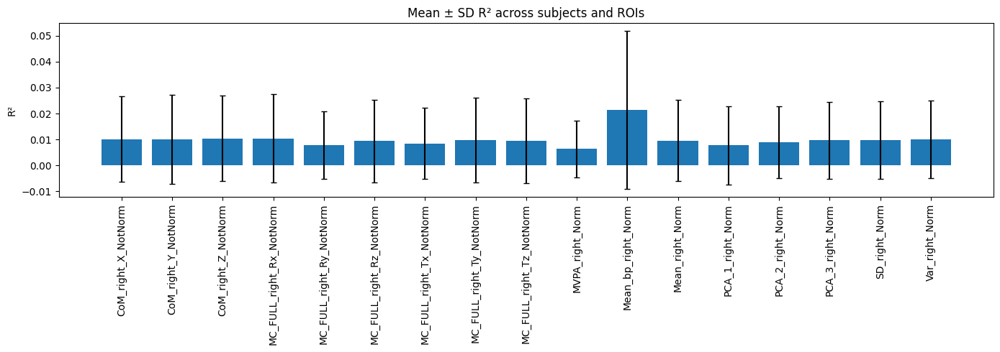

In [106]:
import pandas as pd

# Compute mean and SD across all subjects and ROIs for each column
r2_stats = pd.DataFrame({
    'mean_r2': big_df.mean(axis=0),
    'sd_r2': big_df.std(axis=0)
})

print(r2_stats)
import matplotlib.pyplot as plt

# Bar plot: mean ± SD
plt.figure(figsize=(14, 5))
plt.bar(r2_stats.index, r2_stats['mean_r2'], yerr=r2_stats['sd_r2'], capsize=3)
plt.xticks(rotation=90)
plt.ylabel("R²")
plt.title("Mean ± SD R² across subjects and ROIs")
plt.tight_layout()
plt.show()


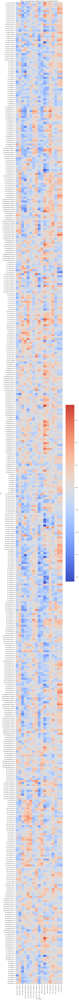

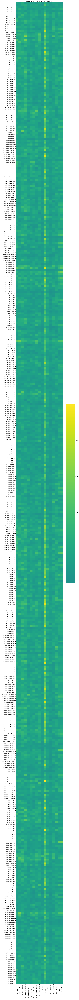

In [113]:
import seaborn as sns

# -----------------------------
# Prepare long-format DataFrame
# -----------------------------
# Reset index to get ROI and subject as columns
coef_hrf_df = big_coef_df.reset_index().melt(
    id_vars=["subject", "roi"], 
    var_name="FMRI_metric", 
    value_name="Coefficient"
)

r2_hrf_df = big_df.reset_index().melt(
    id_vars=["subject", "roi"],
    var_name="FMRI_metric",
    value_name="Partial_R2"
)

# Merge coefficients and R² into a single DataFrame
coef_hrf_df = coef_hrf_df.merge(
    r2_hrf_df, on=["subject", "roi", "FMRI_metric"]
)

# Rename ROI column for consistency
coef_hrf_df.rename(columns={"roi": "ROI"}, inplace=True)

# -----------------------------
# Keep original order of ROIs and fMRI metrics
# -----------------------------
roi_order = neural_data.columns
fmri_order = coef_hrf_df['FMRI_metric'].unique()

# Aggregate across subjects
group_summary = coef_hrf_df.groupby(["ROI", "FMRI_metric"]).agg(
    median_coef=('Coefficient', 'median'),
    median_r2=('Partial_R2', 'median')
).reset_index()

# Pivot with specified order to preserve ROI and metric order
coef_matrix = group_summary.pivot(index='ROI', columns='FMRI_metric', values='median_coef')
r2_matrix = group_summary.pivot(index='ROI', columns='FMRI_metric', values='median_r2')

# Reorder rows and columns
coef_matrix = coef_matrix.loc[roi_order, fmri_order]
r2_matrix = r2_matrix.loc[roi_order, fmri_order]

# -----------------------------
# Plot coefficient heatmap
# -----------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(coef_matrix, cmap='coolwarm', center=0)
plt.title("Median Linear Regression Coefficients (HRF-convolved fMRI metrics)")
plt.xlabel("fMRI Metrics")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()

# -----------------------------
# Plot R² heatmap
# -----------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(r2_matrix, cmap='viridis', center=0)
plt.title("Median Partial R² (HRF-convolved fMRI metrics)")
plt.xlabel("fMRI Metrics")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()


In [126]:
# Band-pass all the files 

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import t, combine_pvalues
from statsmodels.stats.multitest import multipletests
from scipy.signal import butter, filtfilt

# -----------------------------
# Helper: bandpass a DataFrame
# -----------------------------
def bandpass_dataframe(df, lowcut, highcut, fs, order=4):
    """
    Bandpass each column of df between lowcut and highcut (Hz) using a Butterworth filter.
    NaNs in each column are linearly interpolated prior to filtering. If the signal is too
    short for filtfilt's padlen, the function will return the interpolated (unfiltered)
    version for that column.
    """
    df_out = pd.DataFrame(index=df.index, columns=df.columns, dtype=float)
    nyq = 0.5 * fs
    lown = lowcut / nyq
    highn = highcut / nyq
    if lown <= 0 or highn >= 1 or lown >= highn:
        raise ValueError("Invalid band: lowcut=%g, highcut=%g, nyquist=%g" % (lowcut, highcut, nyq))
    b, a = butter(order, [lown, highn], btype='band')

    # padlen requirement for filtfilt
    padlen = 3 * (max(len(a), len(b)) - 1)

    for col in df.columns:
        x = df[col].values.astype(float)
        n = len(x)
        mask = ~np.isnan(x)

        if mask.sum() == 0:
            # all NaN -> leave as NaN
            df_out[col] = np.nan
            continue
        if mask.sum() < 2:
            # not enough valid points to interpolate meaningfully
            # keep original values
            df_out[col] = x
            continue

        # linear interpolation of NaNs (will extrapolate using first/last known values)
        xp = np.arange(n)
        x_interp = x.copy()
        x_interp[~mask] = np.interp(xp[~mask], xp[mask], x[mask])

        # if too short for filtfilt, skip filtering (return interpolated)
        if n <= padlen:
            df_out[col] = x_interp
            continue

        try:
            x_filt = filtfilt(b, a, x_interp)
            df_out[col] = x_filt
        except Exception as e:
            # if filtering fails for any reason, fall back to interpolated signal
            print(f"Warning: filtering failed for column {col}: {e}. Returning interpolated signal.")
            df_out[col] = x_interp

    # preserve the index and column names
    df_out.index = df.index
    df_out.columns = df.columns
    return df_out

# -----------------------------
# Settings
# -----------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()  # replace with your actual loader

fmri_cols = [
 'Mean_right_Norm', 'Mean_bp_right_Norm', 'Var_right_Norm', 'SD_right_Norm',
 'MC_FULL_right_Tx_NotNorm','MC_FULL_right_Ty_NotNorm','MC_FULL_right_Tz_NotNorm',
 'MC_FULL_right_Rx_NotNorm','MC_FULL_right_Ry_NotNorm','MC_FULL_right_Rz_NotNorm',
 'PCA_1_right_Norm','PCA_2_right_Norm','PCA_3_right_Norm','MVPA_right_Norm',
 'CoM_right_X_NotNorm','CoM_right_Y_NotNorm','CoM_right_Z_NotNorm'
]

motion_cols = ['Tx','Ty','Tz','Rx','Ry','Rz','WM','CSF','FD']

# Bandpass settings
TR = 2.5
fs = 1.0 / TR  # sampling frequency (Hz)
LOWCUT = 0.01  # Hz
HIGHCUT = 0.025  # Hz
BP_ORDER = 4

# -----------------------------
# Containers
# -----------------------------
per_subject_r2 = []
per_subject_coef = []
per_subject_pval = []
subjects_seen = []

# -----------------------------
# Loop over subjects
# -----------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    # Load subject data using your loader (expecting ortvec_df, neural_data, ..., fmri_eye_df)
    ortvec_df, neural_data, _, fmri_eye_df = loader.load_subject(subj_id)

    # Bandpass all signals in fmri_eye_df (and then select fmri_cols)
    # Note: this will bandpass any columns present in fmri_eye_df
    try:
        fmri_eye_df_bp = bandpass_dataframe(fmri_eye_df, LOWCUT, HIGHCUT, fs, order=BP_ORDER)
    except Exception as e:
        # If bandpass fails globally, fall back to original with a warning
        print(f"Warning: Bandpass failed for subject {subj_id}: {e}. Using original fmri_eye_df without bandpass.")
        fmri_eye_df_bp = fmri_eye_df.copy()

    # Now take the subset of fMRI columns you care about
    fmri_df = fmri_eye_df_bp[fmri_cols].copy()

    # Optionally: if you also want to bandpass motion regressors (unasked, but shown for completeness),
    # uncomment the following lines:
    # try:
    #     ortvec_df_bp = bandpass_dataframe(ortvec_df[motion_cols], LOWCUT, HIGHCUT, fs, order=BP_ORDER)
    # except Exception as e:
    #     print(f"Warning: Bandpass motion failed for subject {subj_id}: {e}. Using original ortvec.")
    #     ortvec_df_bp = ortvec_df[motion_cols].copy()
    # motion_df = ortvec_df_bp.copy()

    # If not bandpassing motion, use as before:
    motion_df = ortvec_df[motion_cols].copy()

    # Load ROIs
    roilist = pd.read_csv(
        "/mnt/compneuro/comparison_of_methods/matrices/roilist.txt",
        sep=r"\s+", header=None
    ).values.flatten()
    neural_data = pd.DataFrame(neural_data, columns=roilist)

    # -----------------------------
    # Skip HRF convolution: just use raw fMRI (now bandpassed)
    # -----------------------------
    fmri_hrf_df = fmri_df.copy()

    # Z-score (after bandpass)
    fmri_hrf_df = (fmri_hrf_df - fmri_hrf_df.mean()) / fmri_hrf_df.std()
    motion_df = (motion_df - motion_df.mean()) / motion_df.std()
    neural_data = (neural_data - neural_data.mean()) / neural_data.std()

    # Combine predictors (without motion here; include motion_df if desired)
    X_full = fmri_hrf_df  # pd.concat([fmri_hrf_df, motion_df], axis=1) if motion is included

    # -----------------------------
    # Compute per-subject R², coef, p-value
    # -----------------------------
    r2_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)
    coef_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)
    pval_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns, dtype=float)

    for roi in neural_data.columns:
        y = neural_data[roi].values
        for pred in X_full.columns:
            x = X_full[[pred]].values
            mask = ~np.isnan(x[:,0]) & ~np.isnan(y)
            if np.sum(mask) < 3:
                r2_mat.loc[roi,pred] = np.nan
                coef_mat.loc[roi,pred] = np.nan
                pval_mat.loc[roi,pred] = np.nan
                continue

            X = x[mask]
            Y = y[mask]
            lm = LinearRegression().fit(X,Y)
            y_pred = lm.predict(X)
            residuals = Y - y_pred
            n = len(Y)
            # Compute standard error for slope
            denom = np.sum((X[:,0] - X[:,0].mean())**2)
            if denom == 0 or n <= 2:
                se = np.nan
                t_val = np.nan
                pval = np.nan
            else:
                se = np.sqrt(np.sum(residuals**2) / (n - 2)) / np.sqrt(denom)
                t_val = lm.coef_[0] / se
                pval = 2 * (1 - t.cdf(np.abs(t_val), df=n - 2))

            r2_mat.loc[roi,pred] = lm.score(X,Y)
            coef_mat.loc[roi,pred] = lm.coef_[0]
            pval_mat.loc[roi,pred] = pval

    per_subject_r2.append(r2_mat)
    per_subject_coef.append(coef_mat)
    per_subject_pval.append(pval_mat)
    subjects_seen.append(subj_id)

# -----------------------------
# Aggregate across subjects (same as before)
# -----------------------------
all_preds = sorted({c for m in per_subject_r2 for c in m.columns})
all_rois = sorted({c for m in per_subject_r2 for c in m.index})

# R²
aligned_r2 = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_r2]
concat_r2_list = []
for subj, mat in zip(subjects_seen, aligned_r2):
    df = mat.copy()
    df["subject"] = subj
    df["roi"] = df.index
    concat_r2_list.append(df.reset_index(drop=True).set_index(["subject","roi"]))
big_df = pd.concat(concat_r2_list, axis=0).sort_index()
median_r2_matrix = big_df.groupby(level="roi").median()

# Coefficients
aligned_coef = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_coef]
concat_coef_list = []
for subj, mat in zip(subjects_seen, aligned_coef):
    df = mat.copy()
    df["subject"] = subj
    df["roi"] = df.index
    concat_coef_list.append(df.reset_index(drop=True).set_index(["subject","roi"]))
big_coef_df = pd.concat(concat_coef_list, axis=0).sort_index()
median_coef_matrix = big_coef_df.groupby(level="roi").median()

# P-values: combine with Fisher
aligned_pval = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_pval]
median_pval_matrix = pd.DataFrame(index=all_rois, columns=all_preds, dtype=float)
for roi in all_rois:
    for pred in all_preds:
        vals = [m.loc[roi,pred] for m in aligned_pval if not pd.isna(m.loc[roi,pred])]
        if len(vals)==0:
            median_pval_matrix.loc[roi,pred] = np.nan
            continue
        _, combined_p = combine_pvalues(vals, method='fisher')
        median_pval_matrix.loc[roi,pred] = combined_p

# FDR correction
pvals_flat = median_pval_matrix.values.flatten()
mask_nan = ~np.isnan(pvals_flat)
pvals_to_correct = pvals_flat[mask_nan]
reject, pvals_corrected, _, _ = multipletests(pvals_to_correct, alpha=0.05, method='fdr_bh')
sig_mask = np.zeros_like(pvals_flat, dtype=bool)
sig_mask[mask_nan] = reject
sig_mask = sig_mask.reshape(median_pval_matrix.shape)

# (Optional) Save or inspect outputs
# median_r2_matrix.to_csv("median_r2_matrix.csv")
# median_coef_matrix.to_csv("median_coef_matrix.csv")
# median_pval_matrix.to_csv("median_pval_matrix.csv")


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/scipy/stats/_stats_py.py:9638: RuntimeWarning: divide by zero encountered in log
  statistic = -2 * np.sum(np.log(pvalues))


In [131]:
median_per_fmri.std()

0.0018474724757230293

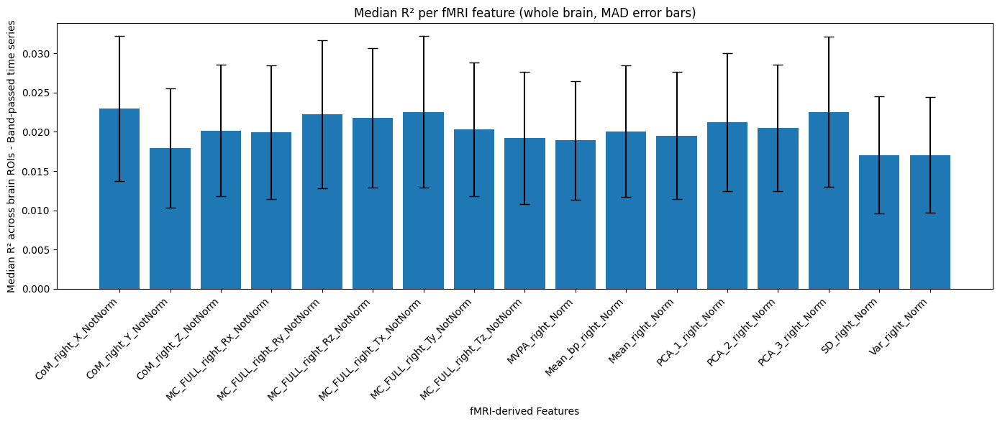

In [128]:
# -----------------------------
# Compute median R² per FMRI feature across ROIs and subjects
# -----------------------------
# Flatten big_df: index = (subject, ROI), columns = fMRI features
# Median across ROIs for each subject, then median across subjects
bp_set=big_df.copy()
median_per_fmri = bp_set.mean(axis=0)  # median over (subject, ROI) for each FMRI feature

# MAD for error bars
mad_per_fmri = bp_set.median(axis=0).groupby(bp_set.columns).apply(
    lambda x: np.median(np.abs(bp_set[x.name] - np.median(bp_set[x.name])))
)

# -----------------------------
# Bar plot
# -----------------------------
plt.figure(figsize=(14,6))
order = bp_set.columns  # keep the original order of FMRI features
vals = median_per_fmri.loc[order].values
errs = mad_per_fmri.loc[order].values

plt.bar(range(len(order)), vals, yerr=errs, capsize=5)
plt.xticks(range(len(order)), order, rotation=45, ha="right")
plt.ylabel("Median R² across brain ROIs - Band-passed time series")
plt.xlabel("fMRI-derived Features")
plt.title("Median R² per fMRI feature (whole brain, MAD error bars)")
plt.tight_layout()
plt.show()


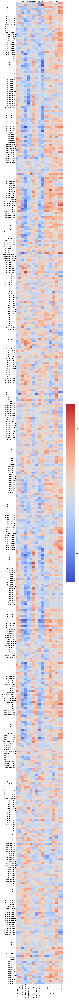

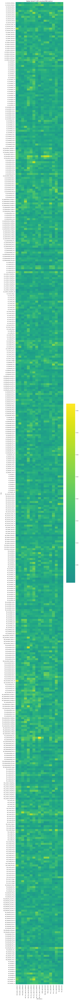

In [132]:
import seaborn as sns

# -----------------------------
# Prepare long-format DataFrame
# -----------------------------
# Reset index to get ROI and subject as columns
coef_hrf_df = big_coef_df.reset_index().melt(
    id_vars=["subject", "roi"], 
    var_name="FMRI_metric", 
    value_name="Coefficient"
)

r2_hrf_df = big_df.reset_index().melt(
    id_vars=["subject", "roi"],
    var_name="FMRI_metric",
    value_name="Partial_R2"
)

# Merge coefficients and R² into a single DataFrame
coef_hrf_df = coef_hrf_df.merge(
    r2_hrf_df, on=["subject", "roi", "FMRI_metric"]
)

# Rename ROI column for consistency
coef_hrf_df.rename(columns={"roi": "ROI"}, inplace=True)

# -----------------------------
# Keep original order of ROIs and fMRI metrics
# -----------------------------
roi_order = neural_data.columns
fmri_order = coef_hrf_df['FMRI_metric'].unique()

# Aggregate across subjects
group_summary = coef_hrf_df.groupby(["ROI", "FMRI_metric"]).agg(
    median_coef=('Coefficient', 'median'),
    median_r2=('Partial_R2', 'median')
).reset_index()

# Pivot with specified order to preserve ROI and metric order
coef_matrix = group_summary.pivot(index='ROI', columns='FMRI_metric', values='median_coef')
r2_matrix = group_summary.pivot(index='ROI', columns='FMRI_metric', values='median_r2')

# Reorder rows and columns
coef_matrix = coef_matrix.loc[roi_order, fmri_order]
r2_matrix = r2_matrix.loc[roi_order, fmri_order]

# -----------------------------
# Plot coefficient heatmap
# -----------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(coef_matrix, cmap='coolwarm', center=0)
plt.title("Median Linear Regression Coefficients (HRF-convolved fMRI metrics)")
plt.xlabel("fMRI Metrics")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()

# -----------------------------
# Plot R² heatmap
# -----------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(r2_matrix, cmap='viridis', center=0)
plt.title("Median Partial R² (HRF-convolved fMRI metrics)")
plt.xlabel("fMRI Metrics")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()


/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_663717/3867912018.py:43: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  niplot.view_img(new_img, threshold=0.05)



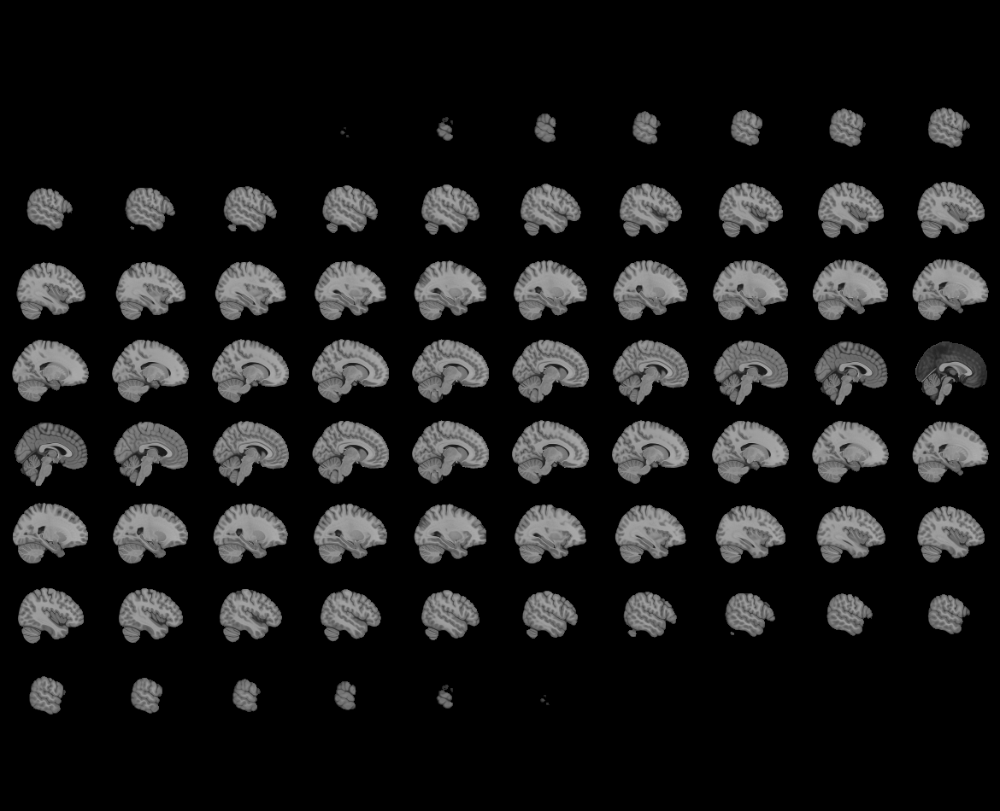
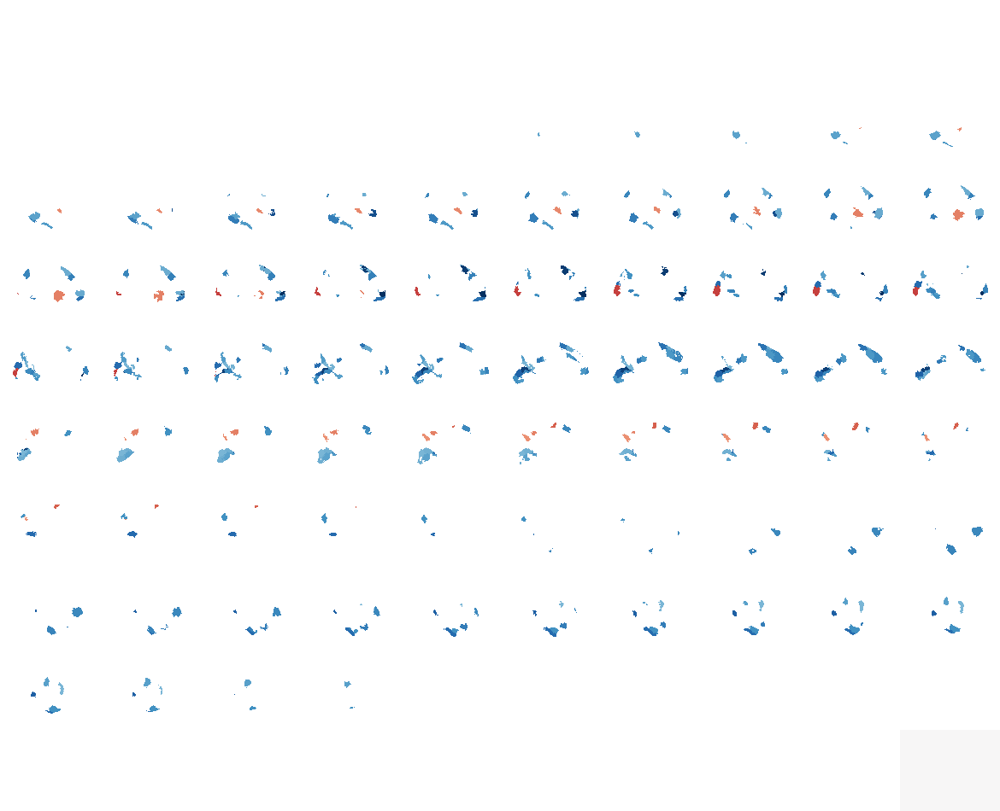

In [40]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['CoM_right_X_NotNorm'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img, threshold=0.05)

/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_663717/3421964269.py:43: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  niplot.view_img(new_img, threshold=0.05)



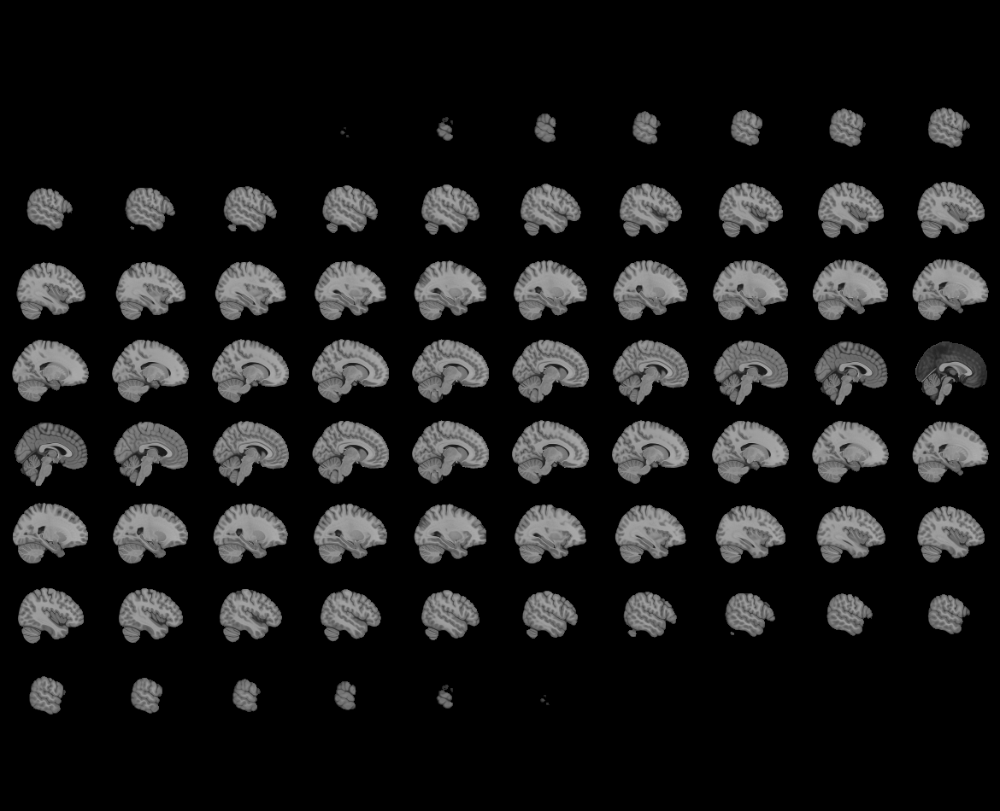
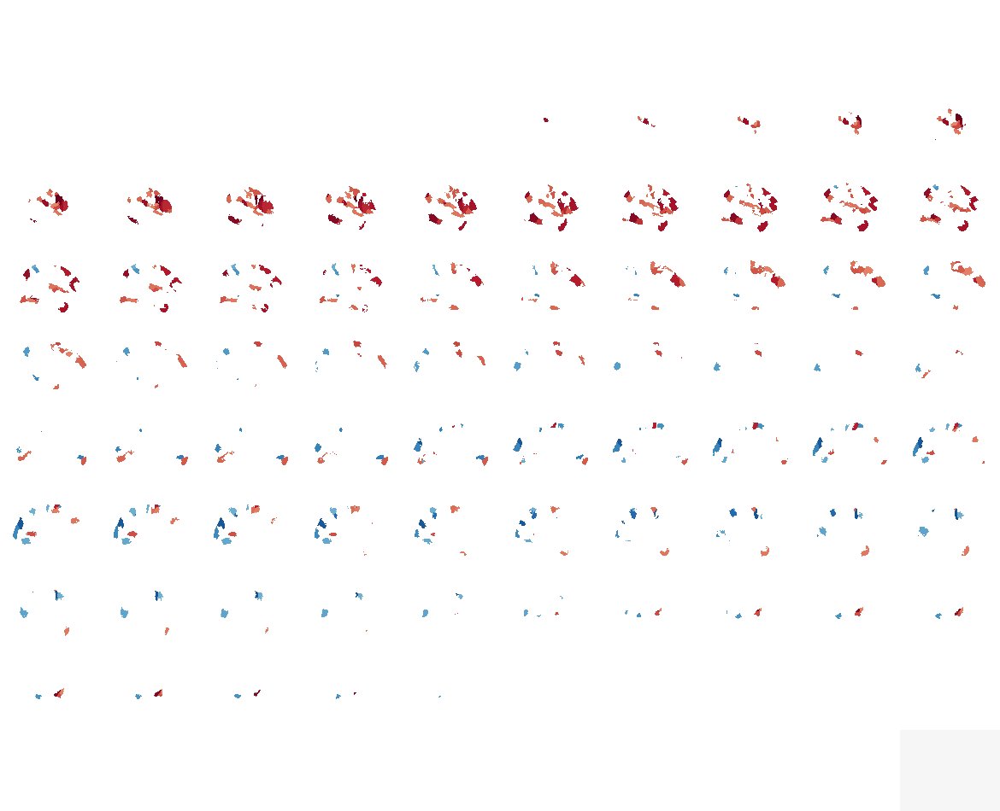

In [48]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['PCA_1_right_Norm'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img, threshold=0.05)

/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_663717/2459093081.py:43: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  niplot.view_img(new_img, threshold=0.05)



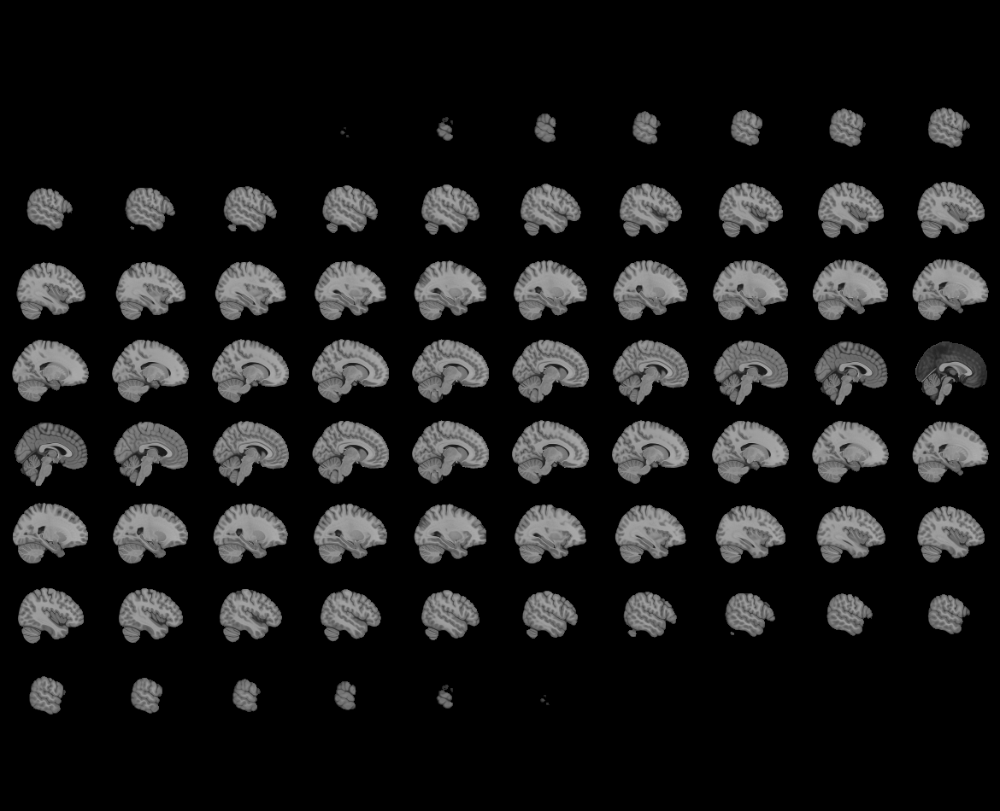
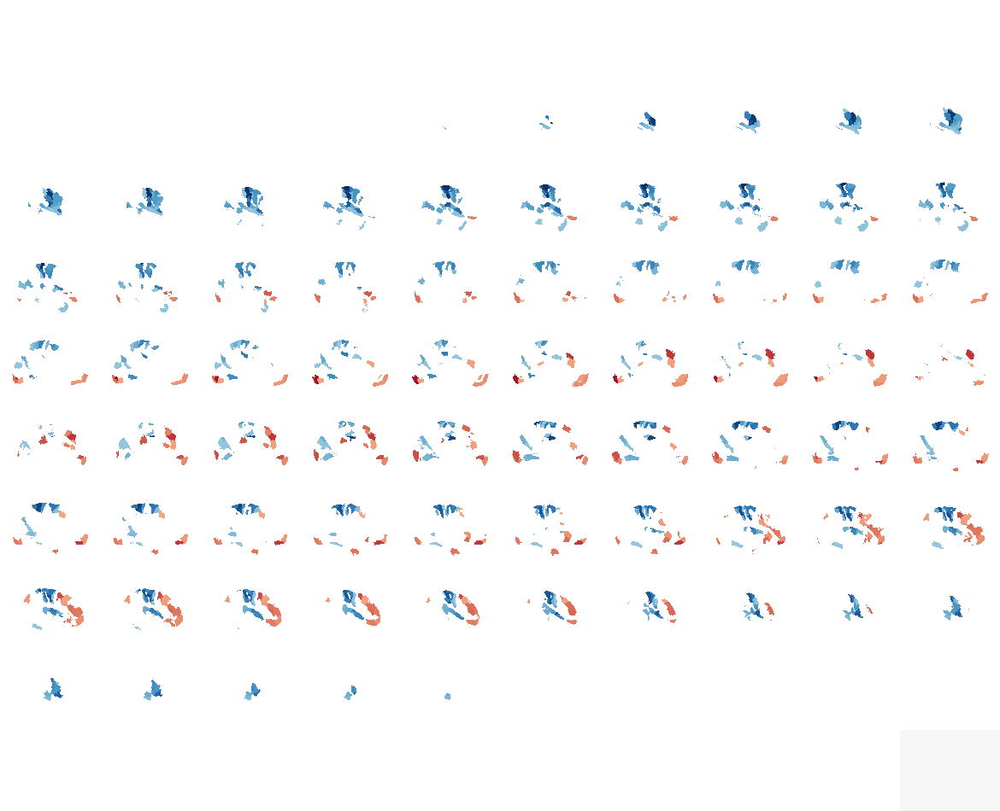

In [44]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['MVPA_right_Norm'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img, threshold=0.05)

In [108]:
# Effects of band-passing 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import t, combine_pvalues
from statsmodels.stats.multitest import multipletests
from scipy.signal import butter, filtfilt

def bandpass_signal(x, lowcut, highcut, fs, order=4):
    return filter_signal(x, lowcut, highcut, fs, order)
# ---------------------------------------------------
# Helper: bandpass one vector
# ---------------------------------------------------
def filter_signal(x, lowcut, highcut, fs, order=4):
    """
    Handles:
      - low-pass   (lowcut = 0)
      - band-pass  (lowcut > 0)
    Automatically fixes invalid bands.
    """
    x = x.astype(float)
    n = len(x)
    mask = ~np.isnan(x)

    if mask.sum() < 2:
        return x

    xp = np.arange(n)
    x_interp = x.copy()
    x_interp[~mask] = np.interp(xp[~mask], xp[mask], x[mask])

    nyq = fs * 0.5
    if highcut >= nyq:
        highcut = nyq - 1e-6  # keeps it valid

    # Normalize
    low = lowcut / nyq
    high = highcut / nyq

    # LOW-PASS case
    if lowcut == 0:
        b, a = butter(order, high, btype="low")

    # BAND-PASS case
    else:
        if low <= 0 or high <= 0 or low >= high:
            print(f"Skipping invalid band {lowcut}-{highcut}")
            return x_interp
        b, a = butter(order, [low, high], btype="band")

    # padding requirement
    padlen = 3 * max(len(a), len(b) - 1)
    if n <= padlen:
        return x_interp

    try:
        return filtfilt(b, a, x_interp)
    except Exception as e:
        print(f"Filter failed for band {lowcut}-{highcut}: {e}")
        return x_interp

# ---------------------------------------------------
# Settings
# ---------------------------------------------------
DATA_DIR = "/mnt/compneuro/comparison_of_methods/dataframes"
subject_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith(".h5")])
loader = SubjectLoader()

motion_cols = ['Tx','Ty','Tz','Rx','Ry','Rz','WM','CSF','FD']

# TR and sampling freq
TR = 2.5
fs = 1.0 / TR

# The frequency bands requested
bands = [
    (0.001, 0.01),
    (0.01, 0.025),
    (0.025, 0.05),
    (0.05, 0.075),   # fixed from 0.075–0.01
    (0.075, 0.1),
    (0.1, 0.2)
]


# ---------------------------------------------------
# Output containers
# ---------------------------------------------------
per_subject_r2 = []
per_subject_coef = []
per_subject_pval = []
subjects_seen = []


# ---------------------------------------------------
# Loop over subjects
# ---------------------------------------------------
for fname in subject_files:
    subj_id = fname.replace("sub-", "").replace(".h5", "")
    print(f"Processing subject {subj_id}")

    ortvec_df, neural_data, _, fmri_eye_df = loader.load_subject(subj_id)

    # -----------------------------------------------
    # Extract the target signal: Mean_right_Norm
    # -----------------------------------------------
    if "Mean_right_Norm" not in fmri_eye_df.columns:
        raise KeyError("Column 'Mean_right_Norm' not found in fmri_eye_df")

    base_sig = fmri_eye_df["MVPA_right_Norm"].values

    # -----------------------------------------------
    # Create the band-pass versions
    # -----------------------------------------------
    bp_dict = {}
    for low, high in bands:
        bp = bandpass_signal(base_sig, low, high, fs, order=4)
        name = f"Mean_right_Norm_bp_{low}_{high}"
        bp_dict[name] = bp

    bp_df = pd.DataFrame(bp_dict, index=fmri_eye_df.index)

    # -----------------------------------------------
    # Z-score predictors
    # -----------------------------------------------
    bp_df = (bp_df - bp_df.mean()) / bp_df.std()

    # Motion regressors (not filtered)
    motion_df = ortvec_df[motion_cols]
    motion_df = (motion_df - motion_df.mean()) / motion_df.std()

    # Load ROIs
    roilist = pd.read_csv(
        "/mnt/compneuro/comparison_of_methods/matrices/roilist.txt",
        sep=r"\s+", header=None
    ).values.flatten()

    neural_data = pd.DataFrame(neural_data, columns=roilist)
    neural_data = (neural_data - neural_data.mean()) / neural_data.std()

    # -----------------------------------------------
    # Use ONLY the band-pass signals as predictors
    # -----------------------------------------------
    X_full = bp_df.copy()


    # -----------------------------------------------
    # Per-subject regression
    # -----------------------------------------------
    r2_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns)
    coef_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns)
    pval_mat = pd.DataFrame(index=neural_data.columns, columns=X_full.columns)

    for roi in neural_data.columns:
        y = neural_data[roi].values
        for pred in X_full.columns:
            x = X_full[[pred]].values
            mask = ~np.isnan(x[:,0]) & ~np.isnan(y)
            if mask.sum() < 3:
                r2_mat.loc[roi,pred] = np.nan
                coef_mat.loc[roi,pred] = np.nan
                pval_mat.loc[roi,pred] = np.nan
                continue

            X = x[mask]
            Y = y[mask]
            lm = LinearRegression().fit(X, Y)
            y_pred = lm.predict(X)
            residuals = Y - y_pred
            n = len(Y)
            denom = np.sum((X[:,0] - X[:,0].mean())**2)

            if denom == 0 or n <= 2:
                pval = np.nan
            else:
                se = np.sqrt(np.sum(residuals**2)/(n-2)) / np.sqrt(denom)
                tval = lm.coef_[0] / se
                pval = 2 * (1 - t.cdf(abs(tval), df=n-2))

            r2_mat.loc[roi,pred] = lm.score(X,Y)
            coef_mat.loc[roi,pred] = lm.coef_[0]
            pval_mat.loc[roi,pred] = pval

    per_subject_r2.append(r2_mat)
    per_subject_coef.append(coef_mat)
    per_subject_pval.append(pval_mat)
    subjects_seen.append(subj_id)


# ---------------------------------------------------
# Aggregation across subjects
# ---------------------------------------------------
all_preds = sorted({c for m in per_subject_r2 for c in m.columns})
all_rois = sorted({c for m in per_subject_r2 for c in m.index})

# R2
aligned_r2 = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_r2]
big_r2 = pd.concat([
    df.assign(subject=subj, roi=df.index).reset_index(drop=True).set_index(["subject","roi"])
    for df, subj in zip(aligned_r2, subjects_seen)
])
median_r2_matrix = big_r2.groupby(level="roi").median()

# Coefs
aligned_coef = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_coef]
big_coef = pd.concat([
    df.assign(subject=subj, roi=df.index).reset_index(drop=True).set_index(["subject","roi"])
    for df, subj in zip(aligned_coef, subjects_seen)
])
median_coef_matrix = big_coef.groupby(level="roi").median()

# Combined p-values
aligned_pval = [m.reindex(index=all_rois, columns=all_preds) for m in per_subject_pval]
median_pval_matrix = pd.DataFrame(index=all_rois, columns=all_preds)

for roi in all_rois:
    for pred in all_preds:
        vals = [m.loc[roi,pred] for m in aligned_pval if not pd.isna(m.loc[roi,pred])]
        if len(vals) == 0:
            median_pval_matrix.loc[roi,pred] = np.nan
        else:
            _, p = combine_pvalues(vals, method="fisher")
            median_pval_matrix.loc[roi,pred] = p

# FDR
flat = median_pval_matrix.values.flatten()
mask = ~np.isnan(flat)
reject, corr, _, _ = multipletests(flat[mask], alpha=0.05, method='fdr_bh')
sig_mask = np.zeros_like(flat, dtype=bool)
sig_mask[mask] = reject
sig_mask = sig_mask.reshape(median_pval_matrix.shape)


Processing subject 9001
Processing subject 9007
Processing subject 9008
Processing subject 9013
Processing subject 9023
Processing subject 9025
Processing subject 9029
Processing subject 9033
Processing subject 9041
Processing subject 9048
Processing subject 9050
Processing subject 9053
Processing subject 9055
Processing subject 9057
Processing subject 9063
Processing subject 9070
Processing subject 9071
Processing subject 9074
Processing subject 9077
Processing subject 9081
Processing subject 9082
Processing subject 9083
Processing subject 9084
Processing subject 9085
Processing subject 9087
Processing subject 9088
Processing subject 9091
Processing subject 9092
Processing subject 9100


TypeError: ufunc 'isnan' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [112]:
median_per_pred = bp_set.mean(axis=0)

In [124]:
bp_set.median(axis=0)


Mean_right_Norm_bp_0.001_0.01    0.001773
Mean_right_Norm_bp_0.01_0.025    0.008116
Mean_right_Norm_bp_0.025_0.05    0.007708
Mean_right_Norm_bp_0.05_0.075    0.006503
Mean_right_Norm_bp_0.075_0.1     0.003896
Mean_right_Norm_bp_0.1_0.2       0.000257
dtype: object

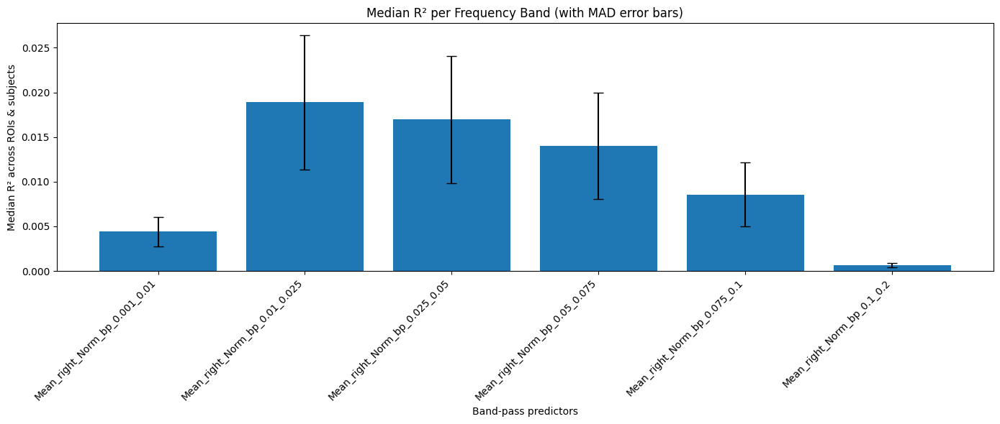

In [110]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------
# Compute median R² per band-pass predictor
# -----------------------------------------
bp_set = big_r2.copy()  # (subject, roi) × predictors

# Median for each predictor across all subjects+ROIs
median_per_pred = bp_set.mean(axis=0)

# MAD per predictor
mad_per_pred = bp_set.apply(lambda col: np.median(np.abs(col - np.median(col))))

# -----------------------------------------
# Plot
# -----------------------------------------
plt.figure(figsize=(14,6))

order = median_per_pred.index  # original predictor order
vals = median_per_pred.values
errs = mad_per_pred.values

plt.bar(range(len(order)), vals, yerr=errs, capsize=5)
plt.xticks(range(len(order)), order, rotation=45, ha="right")

plt.ylabel("Median R² across ROIs & subjects")
plt.xlabel("Band-pass predictors")
plt.title("Median R² per Frequency Band (with MAD error bars)")

plt.tight_layout()
plt.show()


In [111]:
# -----------------------------------------
# Pivot: coefficient and R2 matrices
# -----------------------------------------
coef_matrix = group_summary.pivot(
    index='ROI', columns='Band', values='median_coef'
).reindex(index=roi_order, columns=band_order)

r2_matrix = group_summary.pivot(
    index='ROI', columns='Band', values='median_r2'
).reindex(index=roi_order, columns=band_order)

# -----------------------------------------
# Convert to numeric (fix dtype=object issue)
# -----------------------------------------
coef_matrix = coef_matrix.apply(pd.to_numeric, errors="coerce")
r2_matrix   = r2_matrix.apply(pd.to_numeric, errors="coerce")

print("coef_matrix dtypes:\n", coef_matrix.dtypes)
print("r2_matrix dtypes:\n", r2_matrix.dtypes)

# -----------------------------------------
# HEATMAP — Coefficients
# -----------------------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(coef_matrix, cmap='coolwarm', center=0)
plt.title("Median Linear Regression Coefficients (Band-passed predictors)")
plt.xlabel("Frequency Bands")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()

# -----------------------------------------
# HEATMAP — R²
# -----------------------------------------
plt.figure(figsize=(12, max(6, len(roi_order)*0.3)))
sns.heatmap(r2_matrix, cmap='viridis')
plt.title("Median R² (Band-passed predictors)")
plt.xlabel("Frequency Bands")
plt.ylabel("ROIs")
plt.tight_layout()
plt.show()


KeyError: 'Band'

/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



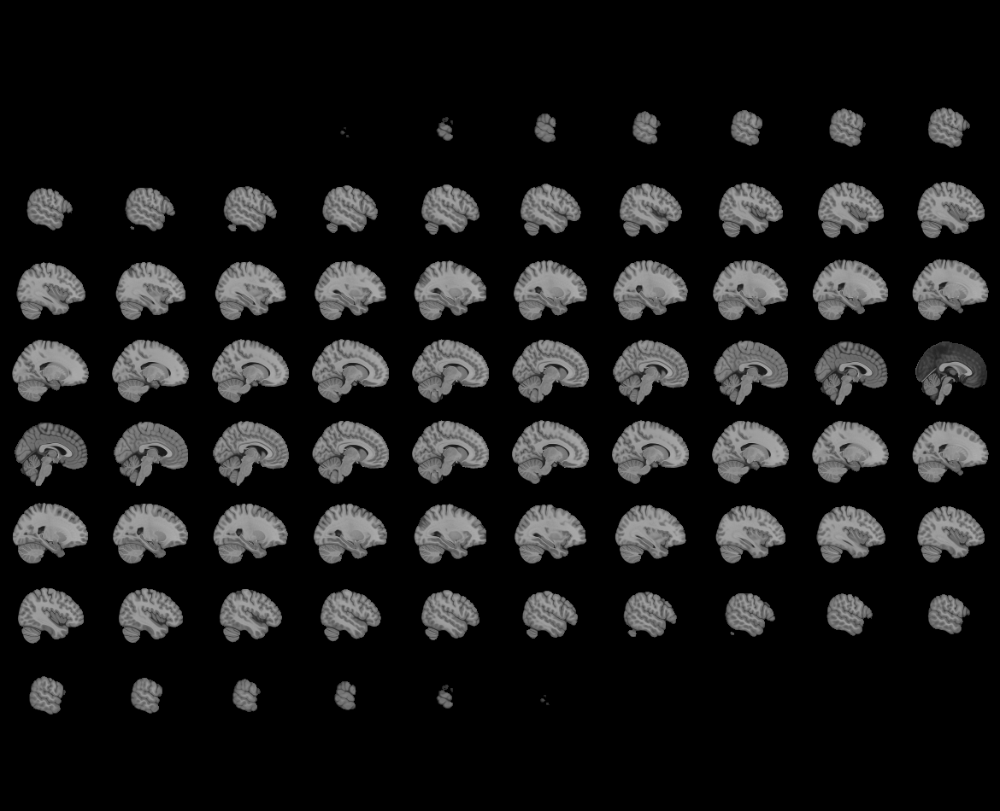
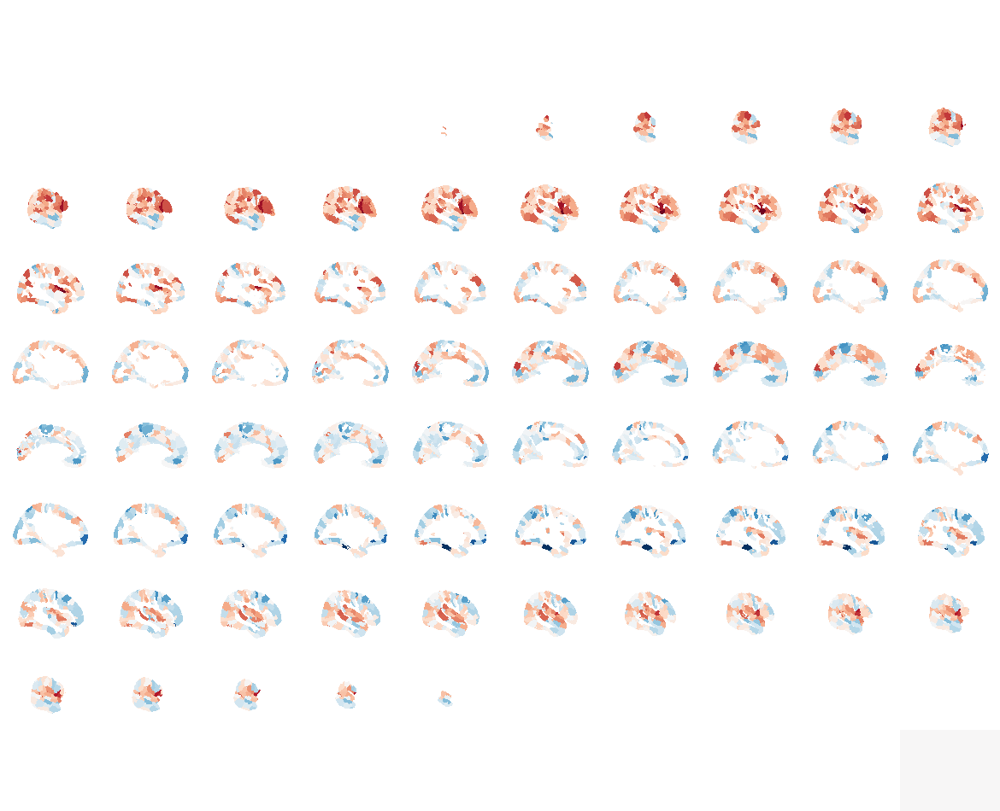

In [59]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['Mean_right_Norm_bp_0.01_0.025'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img)

/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



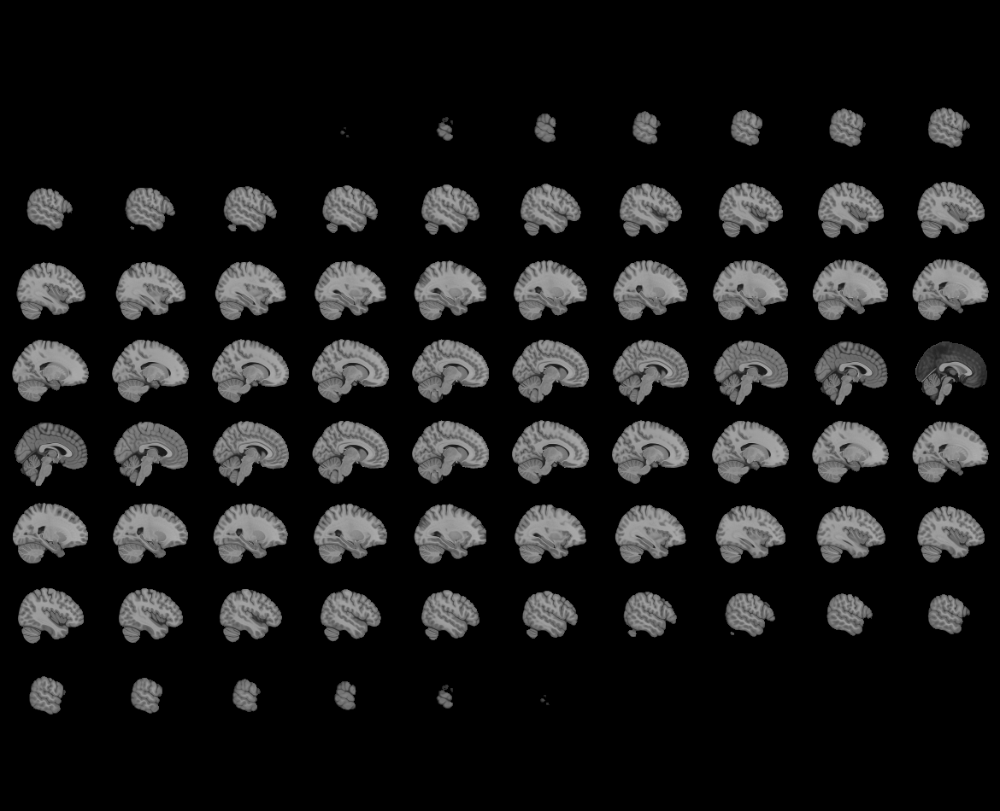
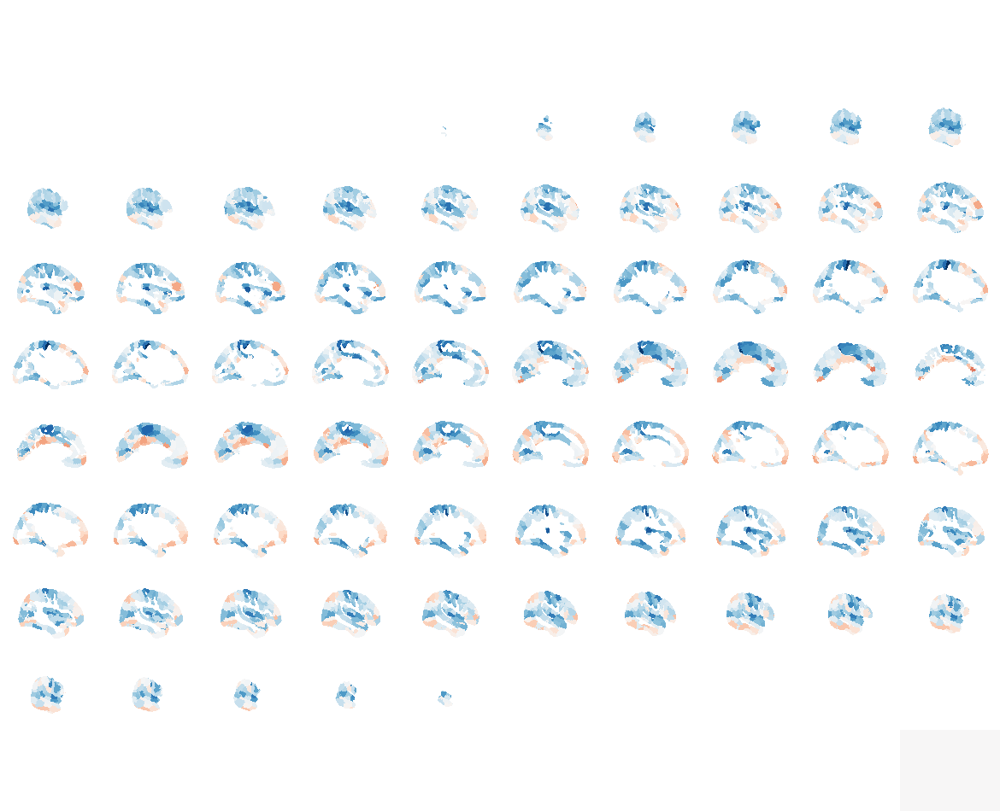

In [58]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['Mean_right_Norm_bp_0.05_0.075'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img)

/home/CemalKoba/venvs/deepmreye-gpu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



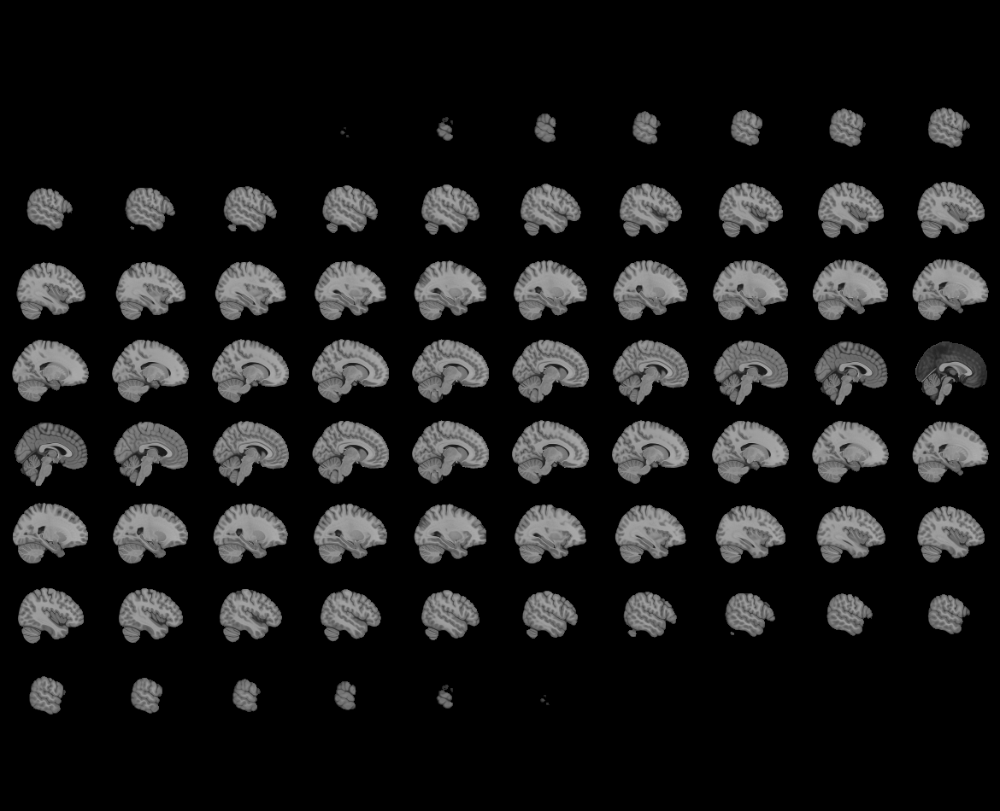
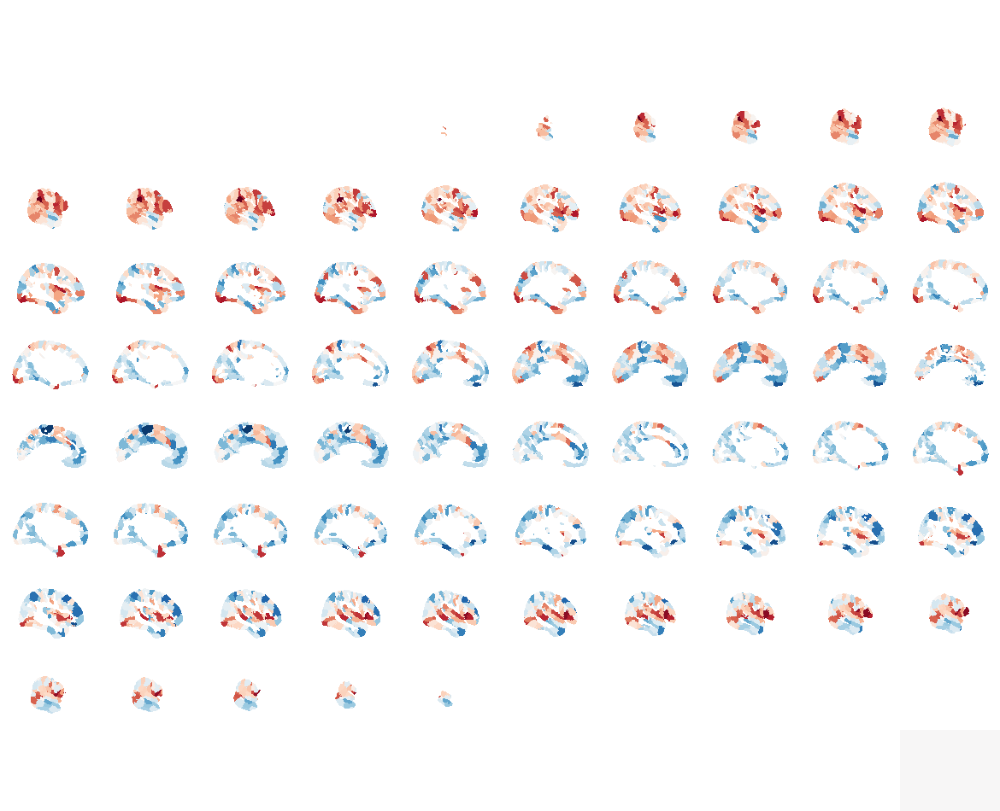

In [60]:
import nibabel as nib
import numpy as np
import nilearn.plotting as niplot
# ----------------------------------------------------
# 1. Load the Schaefer500×17N atlas (1–500 region IDs)
# ----------------------------------------------------
atlas_path = "/home/CemalKoba/nilearn_data/schaefer_2018/Schaefer2018_500Parcels_17Networks_order_FSLMNI152_1mm.nii.gz"
atlas_img = nib.load(atlas_path)
atlas_data = atlas_img.get_fdata().astype(int)

# ----------------------------------------------------
# 2. Load your vector of 500 values (must be ordered)
# ----------------------------------------------------
values = coef_matrix['Mean_right_Norm_bp_0.01_0.02'].values   # shape (500,)

# Safety check
assert values.shape[0] == 500, "Vector must have length 500."

# ----------------------------------------------------
# 3. Create an empty volume for the new scalar map
# ----------------------------------------------------
new_data = np.zeros_like(atlas_data, dtype=float)

# ----------------------------------------------------
# 4. Replace each parcel ID with its corresponding value
# ----------------------------------------------------
for parcel_id in range(1, 501):         # 1 → 500
    mask = atlas_data == parcel_id
    new_data[mask] = values[parcel_id - 1]

# ----------------------------------------------------
# 5. Create a new NIfTI image (same affine + header)
# ----------------------------------------------------
new_img = nib.Nifti1Image(new_data, atlas_img.affine, atlas_img.header)

# ----------------------------------------------------
# 6. Save it (optional)
# ----------------------------------------------------
#out_path = "/home/CemalKoba/schaefer500_heatmap_PCA1.nii.gz"
#nib.save(new_img, out_path)

#print("Saved:", out_path)
niplot.view_img(new_img)